In [1]:
import os
import re
import cv2
import glob
import random
import shutil
import subprocess

import numpy as np
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, ImageDraw, ImageFont
from pathlib import Path
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision
import torchvision.utils as vutils
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
import torchvision.transforms.functional as TF

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, precision_recall_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, precision_recall_curve, auc, roc_curve, confusion_matrix, classification_report

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
device

device(type='cuda')

#### CIFAR10 Dataset

In [4]:
print("Current working directory:", os.getcwd())

Current working directory: /content


In [5]:
base_dir = '/content'

In [6]:
train_dir = os.path.join(base_dir,  'cifar10_train_data')
test_dir  = os.path.join(base_dir,  'cifar10_test_data')

In [7]:
cifar10_train = torchvision.datasets.CIFAR10( root = train_dir, train = True,  download = True)
cifar10_test  = torchvision.datasets.CIFAR10( root = test_dir , train = False, download = True)

100%|██████████| 170M/170M [00:11<00:00, 15.5MB/s]
100%|██████████| 170M/170M [00:10<00:00, 15.8MB/s]


In [8]:
cifar10 = '/content/cifar10'
os.makedirs(cifar10, exist_ok = True)

In [9]:
train_pth = '/content/cifar10/train'
os.makedirs(train_pth, exist_ok = True)

In [10]:
for idx,(img, label) in enumerate(cifar10_train):
  label_dir = os.path.join(train_pth, str(label))
  os.makedirs(label_dir, exist_ok = True)

  img_pth = os.path.join(label_dir, f"{idx}.png")
  img.save(img_pth)

In [11]:
test_pth = '/content/cifar10/test'
os.makedirs(test_pth, exist_ok = True)

In [12]:
for idx, (img,label) in enumerate(cifar10_test):
  label_dir = os.path.join(test_pth, str(label))
  os.makedirs(label_dir, exist_ok = True)

  img_pth = os.path.join(label_dir, f"{idx}.png")
  img.save(img_pth)

In [13]:
garbage_dir = os.path.join(train_pth, "garbage")
os.makedirs(garbage_dir, exist_ok = True)

In [14]:
!ls '/content/cifar10/train'

0  1  2  3  4  5  6  7	8  9  garbage


In [15]:
!ls '/content/cifar10/test'

0  1  2  3  4  5  6  7	8  9


In [16]:
for i in range(10):
  dir_pth = os.path.join(train_pth, f"{i}")
  dir_size = len([f for f in os.listdir(dir_pth) if os.path.isfile(os.path.join(dir_pth,f))])
  print(f"size of class{i}:{dir_size}")

size of class0:5000
size of class1:5000
size of class2:5000
size of class3:5000
size of class4:5000
size of class5:5000
size of class6:5000
size of class7:5000
size of class8:5000
size of class9:5000


In [17]:
for i in range(10):
  dir_pth = os.path.join(test_pth, f"{i}")
  dir_size = len([f for f in os.listdir(dir_pth) if os.path.isfile(os.path.join(dir_pth,f))])
  print(f"size of class{i}:{dir_size}")

size of class0:1000
size of class1:1000
size of class2:1000
size of class3:1000
size of class4:1000
size of class5:1000
size of class6:1000
size of class7:1000
size of class8:1000
size of class9:1000


#### Guassian noise samples in garbage class

In [18]:
# folder_path = garbage_dir
# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

In [19]:
# garbage_dir = os.path.join(train_pth, "garbage")
# os.makedirs(garbage_dir, exist_ok = True)

In [20]:
noise_samples = 5000
print("Generating Gaussian noise samples for garbage class...")

for i in range(noise_samples):
    # Generate Gaussian noise (mean=0.5, std=0.15 to keep most values in reasonable range)
    random_noise = torch.randn(3,32,32) * 0.15 + 0.5
    random_noise = torch.clamp(random_noise, 0, 1)  # Ensure values are in [0, 1]

    # Convert to PIL Image (simulating the raw input format)
    random_noise_pil = transforms.ToPILImage()(random_noise)

    ood_image_pth = os.path.join(garbage_dir, f"noise_{i+1}.png")
    random_noise_pil.save(ood_image_pth)

print(f"Generated {noise_samples} Gaussian noise samples")

Generating Gaussian noise samples for garbage class...
Generated 5000 Gaussian noise samples


#### Transformations

In [ ]:
# def calculate_mean_std_color(dataset_loader):
#     """
#     Calculate mean and standard deviation for a color (3-channel) dataset
#     """

#     channels_sum, channels_squared_sum, num_batches = torch.zeros(3), torch.zeros(3), 0

#     for data, _ in dataset_loader:
#         # Sum over all pixels and all batches for each channel
#         channels_sum += torch.mean(data, dim=[0, 2, 3])
#         channels_squared_sum += torch.mean(data**2, dim=[0, 2, 3])
#         num_batches += 1

#     # mean and std
#     mean = channels_sum / num_batches
#     std = (channels_squared_sum / num_batches - mean**2)**0.5

#     return mean, std

# # Create transform
# transform = transforms.Compose([
#     transforms.ToTensor()
# ])

# print("Calculating for CIFAR-10...")
# cifar10_train = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
# cifar10_loader = DataLoader(cifar10_train, batch_size=64, shuffle=False)
# cifar10_mean, cifar10_std = calculate_mean_std_color(cifar10_loader)
# print(f""" CIFAR-10 - Mean: {cifar10_mean.tolist()},
#             Std: {cifar10_std.tolist()}""")

Calculating for CIFAR-10...


100%|██████████| 170M/170M [00:03<00:00, 56.5MB/s]


 CIFAR-10 - Mean: [0.4914625287055969, 0.48222312331199646, 0.44661077857017517],
            Std: [0.24703028798103333, 0.24348397552967072, 0.26159432530403137]


In [21]:
# Define CIFAR-10 transform (using CIFAR-10 statistics)
cifar10_mean = (0.4914, 0.4822, 0.4466)   # CIFAR-10 mean for each channel
cifar10_std  = (0.2470, 0.2435, 0.2616)   # CIFAR-10 std  for each channel

cifar10_transform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    transforms.Normalize(cifar10_mean, cifar10_std)
])

In [22]:
train_dataset = ImageFolder(root=train_pth, transform  = cifar10_transform)
test_dataset  = ImageFolder(root=test_pth,  transform  = cifar10_transform)

In [23]:
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_dataset , batch_size=batch_size, shuffle=False)

#### Checking Datasets and DataLoaders

In [ ]:
img, label = train_dataset[0]
print(type(img), img.shape)
print(type(label), label)

<class 'torch.Tensor'> torch.Size([3, 32, 32])
<class 'int'> 0


In [ ]:
img, label = train_dataset[51000]
print(type(img), img.shape)
print(type(label), label)

<class 'torch.Tensor'> torch.Size([3, 32, 32])
<class 'int'> 10


In [ ]:
len(train_dataset)

55000

In [ ]:
len(test_dataset)

10000

In [ ]:
train_dataset.samples[:5]

[('/content/cifar10/train/0/10008.png', 0),
 ('/content/cifar10/train/0/10010.png', 0),
 ('/content/cifar10/train/0/10020.png', 0),
 ('/content/cifar10/train/0/10024.png', 0),
 ('/content/cifar10/train/0/10031.png', 0)]

In [ ]:
train_dataset.samples[-5:-1]

[('/content/cifar10/train/garbage/noise_995.png', 10),
 ('/content/cifar10/train/garbage/noise_996.png', 10),
 ('/content/cifar10/train/garbage/noise_997.png', 10),
 ('/content/cifar10/train/garbage/noise_998.png', 10)]

In [ ]:
len(train_loader)

1719

In [ ]:
len(test_loader)

313

In [ ]:
for imgs, labels in train_loader:
    print(type(imgs), imgs.shape)      # torch.Tensor [batch, 1, 28, 28]
    print(type(labels), labels.shape)  # torch.Tensor [batch]
    break

<class 'torch.Tensor'> torch.Size([32, 3, 32, 32])
<class 'torch.Tensor'> torch.Size([32])


In [ ]:
for imgs, labels in test_loader:
    print(type(imgs), imgs.shape)      # torch.Tensor [batch, 1, 28, 28]
    print(type(labels), labels.shape)  # torch.Tensor [batch]
    break

<class 'torch.Tensor'> torch.Size([32, 3, 32, 32])
<class 'torch.Tensor'> torch.Size([32])


In [ ]:
mean_sum = torch.zeros(3)
std_sum = torch.zeros(3)
total_samples = 0
# Calculate mean and std per batch
with torch.no_grad():
    for images, _ in train_loader:
        # Reshape from [B, C, H, W] to [B, C, H*W]
        b, c, h, w = images.shape
        images_flat = images.view(b, c, h * w)

        # Calculate mean and std for each channel in this batch
        batch_mean = images_flat.mean(dim=2)   # Shape: [B, C]
        batch_std = images_flat.std(dim=2)     # Shape: [B, C]

        mean_sum += batch_mean.sum(dim=0)
        std_sum += batch_std.sum(dim=0)
        total_samples += b

# Compute the final average mean and std
final_mean = mean_sum / total_samples
final_std = std_sum / total_samples

print(f'CIFAR10 Normalized Mean : {final_mean.tolist()}')
print(f'CIFAR10 Normalized Std  : {final_std.tolist()}')

CIFAR10 Normalized Mean : [0.0024308906868100166, 0.0057714637368917465, 0.017647136002779007]
CIFAR10 Normalized Std  : [0.7996995449066162, 0.8004111647605896, 0.7504575848579407]


In [ ]:
loader = train_loader

all_means, all_stds = [], []
for imgs, labels in loader:
    mask = (labels == 10)       # Only garbage class
    if mask.any():
        garbage_imgs = imgs[mask]
        all_means.append(garbage_imgs.mean().item())
        all_stds.append(garbage_imgs.std().item())

print("Garbage (after transform): mean =", sum(all_means)/len(all_means),
      "std =", sum(all_stds)/len(all_stds))

Garbage (after transform): mean = 0.09626891499387506 std = 0.6029394522000753


In [ ]:
print("Training Dataset:")
print(f"Size:{len(train_dataset)}")
print(f"Shape:{next(iter(train_loader))[0].shape}")
print(f"Batch size: {train_loader.batch_size}")

print("\nTesting Dataset:")
print(f"Size:{len(test_dataset)}")
print(f"Shape:{next(iter(test_loader))[0].shape}")
print(f"Batch size: {test_loader.batch_size}")

Training Dataset:
Size:55000
Shape:torch.Size([32, 3, 32, 32])
Batch size: 32

Testing Dataset:
Size:10000
Shape:torch.Size([32, 3, 32, 32])
Batch size: 32


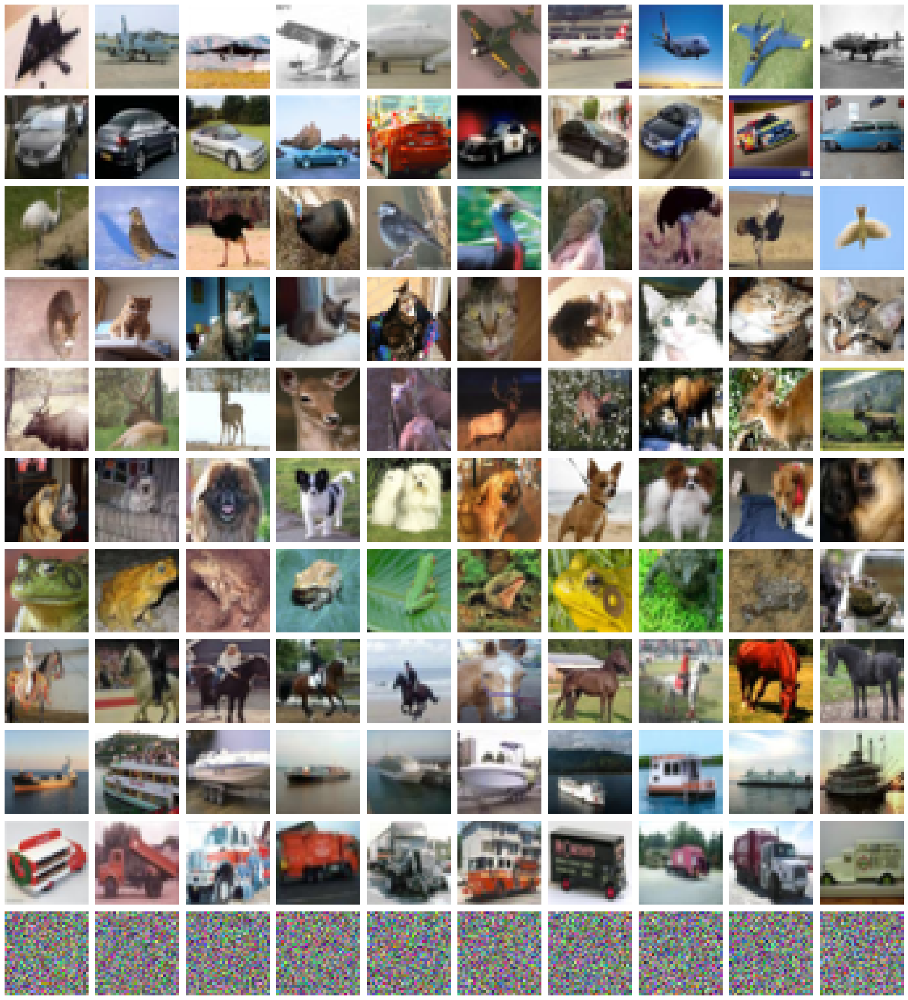

In [ ]:
class_images = {}

for class_name in sorted(os.listdir(train_pth)):
    class_pth = os.path.join(train_pth, class_name)

    if os.path.isdir(class_pth):
        class_images[class_name] = []

        for image_file in os.listdir(class_pth)[:10]:
            image_pth = os.path.join(class_pth, image_file)
            image = cv2.imread(image_pth, cv2.IMREAD_COLOR)     # read in color (BGR)
            if image is not None:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # convert to RGB
                class_images[class_name].append(image)

# Create subplot grid
fig, axs = plt.subplots(len(class_images), 10, figsize=(20, 2*len(class_images)))

for i, (class_name, images) in enumerate(class_images.items()):
    for j in range(10):
        axs[i, j].imshow(images[j])  # already RGB
        axs[i, j].axis("off")

plt.tight_layout()
plt.show()

#### Classifier

##### 5 conv2d + 2 Linear

In [24]:
class Classifier(nn.Module):
    def __init__(self, nc, ncf, n_classes=11):
        super().__init__()

        self.feature_extractor = nn.Sequential(
            # Layer 1:
            nn.Conv2d(nc, ncf, 4, 2, 1, bias=False),      # [B,nc,32,32] -> [B,ncf,16,16]
            nn.BatchNorm2d(ncf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),  # Dropout

            # Layer 2:
            nn.Conv2d(ncf, ncf, 3, 1, 1, bias=False),     # [B,ncf,16,16] -> [B,ncf,16,16]
            nn.BatchNorm2d(ncf),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 3
            nn.Conv2d(ncf, ncf*2, 4, 2, 1, bias=False),   # [B,ncf,16,16] -> [B,ncf*2,8,8]
            nn.BatchNorm2d(ncf*2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),  # Increased dropout

            # Layer 4:
            nn.Conv2d(ncf*2, ncf*2, 3, 1, 1, bias=False), # [B,ncf*2,8,8] -> [B,ncf*2,8,8]
            nn.BatchNorm2d(ncf*2),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 5
            nn.Conv2d(ncf*2, ncf*4, 4, 2, 1, bias=False), # [B,ncf*2,8,8] -> [B,ncf*4,4,4]
            nn.BatchNorm2d(ncf*4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.4),  # Increased dropout

            nn.AdaptiveAvgPool2d(1),                      # [B,ncf*4,4,4] -> [B,ncf*4,1,1]
            nn.Flatten(),                                 # [B,ncf*4]
        )

        self.penultimate = nn.Sequential(
            nn.Linear(ncf*4, ncf*4),                      # [B, ncf*4] --> [B,ncf*4]
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.5),
        )

        self.classifier = nn.Linear(ncf*4, n_classes)     # [B,ncf*4] --> [B, n_classes]

    def forward(self, x):
        features = self.feature_extractor(x)
        penultimate_features = self.penultimate(features)
        logits = self.classifier(penultimate_features)
        return logits, penultimate_features

#### Generator

In [26]:
class Generator(nn.Module):
  def __init__(self, n_classes, nz, ngf, nc):
    super().__init__()

    self.embed = nn.Linear(n_classes, nz)                      # [B,n_classes] --> [B,nz]

    self.main = nn.Sequential(
        nn.ConvTranspose2d(nz*2, ngf*8, 4,1,0,bias=False),     # [B,nz*2,1,1] --> [B,ngf*8,4,4]
        nn.BatchNorm2d(ngf*8),
        nn.LeakyReLU(0.2, inplace=True),

        nn.ConvTranspose2d(ngf*8, ngf*4, 4,2,1,bias=False),    # [B,ngf*8,4,4] --> [B,ngf*4,8,8]
        nn.BatchNorm2d(ngf*4),
        nn.LeakyReLU(0.2, inplace=True),

        nn.ConvTranspose2d(ngf*4, ngf*2, 4,2,1,bias=False),     # [B,ngf*4,8,8] --> [B,ngf*2,16,16]
        nn.BatchNorm2d(ngf*2),
        nn.LeakyReLU(0.2, inplace=True),

        nn.ConvTranspose2d(ngf*2, nc, 4,2,1, bias=False),       # [B,ngf*2,16,16] --> [B,nc,32,32]
        nn.Tanh()
    )

  def forward(self, latent_vec, cond_vec):
      embed_vec = self.embed(cond_vec).unsqueeze(-1).unsqueeze(-1)    #  [B,n_classes] --> [B,nz] --> [B,nz,1,1]
      input = torch.cat([latent_vec, embed_vec],1)   # [B,nz,1,1]+[B,nz,1,1]  dim=1 -->  [B,nz*2,1,1]
      return self.main(input)

#### Checking Classifier and Generator

In [ ]:
nz = 100
nc = 3
ncf = 32
ngf = 64
n_classes = 11
batch_size = 5

gen = Generator(n_classes, nz, ngf, nc).to(device)
csf = Classifier(nc, ncf).to(device)

latent_vec = torch.randn((batch_size, nz, 1, 1), device=device)
print("Latent_vector:", latent_vec.shape)

random_vec = torch.randn((batch_size, n_classes), device=device)
print("Random_vector:", random_vec.shape)

cond_vec = F.softmax(random_vec, dim=1)
print("cond_vector:", cond_vec.shape)

gen_image = gen(latent_vec, cond_vec)
print("Generated image shape:", gen_image.shape)

classifier_op, features = csf(gen_image)
print("Penultimate_Layer_features:", features.shape)
print("Classifier output:", classifier_op.shape)

Latent_vector: torch.Size([5, 100, 1, 1])
Random_vector: torch.Size([5, 11])
cond_vector: torch.Size([5, 11])
Generated image shape: torch.Size([5, 3, 32, 32])
Penultimate_Layer_features: torch.Size([5, 128])
Classifier output: torch.Size([5, 11])


#### Weights_initialization

In [25]:
def weights_initialization_gen_xavier(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.xavier_normal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.xavier_normal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_ortho(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.orthogonal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.orthogonal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_normal(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.normal_(m.weight,mean=0.0,std=0.02)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.normal_(m.weight,mean=0.0,std=0.02)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_uniform(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.uniform_(m.weight, -0.08, 0.08)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.uniform_(m.weight,-0.08, 0.08)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_zero(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.constant_(m.weight,0)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,0)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.constant_(m.weight,0)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_small(m,scale=1):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.constant_(m.weight,scale)
    if m.bias is not None:
      nn.init.constant_(m.bias,scale)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,scale)
    nn.init.constant_(m.bias,scale)
  elif isinstance(m,nn.Linear):
    nn.init.constant_(m.weight,scale)
    if m.bias is not None:
      nn.init.constant_(m.bias,scale)

def weights_initialization_gen_custom(m):
  if isinstance(m,nn.ConvTranspose2d):
    nn.init.normal_(m.weight, mean=0.0,std=0.02)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.orthogonal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

In [26]:
def gen_ordered_batch(n_classes, samples_per_class, nz, device=None):
    batch_size = n_classes * samples_per_class
    noise = torch.randn(batch_size, nz, 1, 1, device=device)
    labels = torch.arange(n_classes, device=device).repeat_interleave(samples_per_class)
    one_hot_labels = F.one_hot(labels, num_classes=n_classes).float().to(device)
    return noise, one_hot_labels

In [27]:
noise, one_hot_labels = gen_ordered_batch(11,10,100)
noise.shape, one_hot_labels

(torch.Size([110, 100, 1, 1]),
 tensor([[1., 0., 0.,  ..., 0., 0., 0.],
         [1., 0., 0.,  ..., 0., 0., 0.],
         [1., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.]]))

#### Train

In [61]:
def train(model, train_loader, optimizer, criterion, n_csf_epochs, device):

    for epoch in tqdm(range(n_csf_epochs), desc="Training", unit="epoch"):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            logits, features = model(images)
            loss  = criterion(logits, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            _, predicted = torch.max(logits.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        avg_loss = running_loss / len(train_loader)
        accuracy = correct / total

    return avg_loss, accuracy

#### Test

In [62]:
def test(model, test_loader, criterion, device):

  model.eval()
  correct = 0
  total = 0
  running_loss = 0

  with torch.no_grad():

    pbar = tqdm(enumerate(test_loader), total=len(test_loader), desc="Testing")

    for i, (images, labels) in pbar:
      images, labels = images.to(device), labels.to(device)
      logits, features = model(images)
      loss = criterion(logits, labels)
      running_loss += loss.item()

      _,predicted = torch.max(logits.data, 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()

      pbar.set_postfix({"Batch Loss": loss.item()})

  avg_loss = running_loss / len(test_loader)
  accuracy = correct / total

  return avg_loss, accuracy

#### Class weights

In [28]:
def cal_class_weights(dataset):

  targets = [target for _,target in dataset.samples]
  targets_tensor = torch.tensor(targets)

  class_counts = torch.bincount(targets_tensor)
  total_samples = len(dataset)

  class_weights = total_samples/(class_counts*len(class_counts))

  return class_weights

In [29]:
train_label_tensor = torch.tensor([label for _,label in train_dataset.samples])
train_label_tensor

tensor([ 0,  0,  0,  ..., 10, 10, 10])

In [30]:
torch.bincount(train_label_tensor)

tensor([5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000])

In [31]:
cal_class_weights(train_dataset)

tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

#### Inversion Loss functions

In [36]:
def kl_divergence(p, q, eps=1e-8):
    p = p.clamp(min=eps, max=1.0)
    q = q.clamp(min=eps, max=1.0)
    kl_div = F.kl_div(p.log(), q, reduction='batchmean')
    return kl_div

def cross_entropy(logits, set_labels):
  ce_loss = F.cross_entropy(logits, set_labels)
  return ce_loss

In [37]:
def cosine_similarity(features, eps=1e-8):
    normalized_features = F.normalize(features, p=2, dim=1, eps=eps)
    similarity_matrix = torch.mm(normalized_features, normalized_features.t())
    mask = torch.eye(similarity_matrix.size(0), device=similarity_matrix.device).bool()
    similarity_matrix = similarity_matrix.masked_fill(mask, 0)
    cos_loss = similarity_matrix.sum() / (features.size(0) * (features.size(0) - 1))
    return cos_loss

# def feature_orthogonality(features):
#     features = F.normalize(features, p=2, dim=1, eps=1e-8)
#     gram_matrix = torch.mm(features, features.t())
#     identity_matrix = torch.eye(gram_matrix.size(0), device=gram_matrix.device)
#     ortho_loss = torch.mean((gram_matrix - identity_matrix) ** 2)
#     return ortho_loss

In [38]:
def compute_inversion_loss(gen_imgs, set_labels, input_pdf, logits, features, alpha, beta, gamma, delta):

    # logits, features = csf(gen_imgs)
    # logits = logits[:,:10]
    kl_loss    = kl_divergence(logits, input_pdf)
    ce_loss    = cross_entropy(logits, set_labels)
    cos_loss   = cosine_similarity(features)
    # ortho_loss = feature_orthogonality(features)

    inversion_loss = (alpha * kl_loss) + (beta * ce_loss) + (gamma * cos_loss)
    # + (delta * ortho_loss)
    return inversion_loss, alpha * kl_loss, beta * ce_loss, gamma * cos_loss
    # , delta * ortho_loss

#### Metrics

In [32]:
def compute_metrics(logits):

  # Confidence
    p = F.softmax(logits, dim=1)
    confidence, _ = torch.max(p, dim=1)

  # Margin
    top2_conf, _ = torch.topk(p, 2, dim=1)
    margin = top2_conf[:, 0] - top2_conf[:, 1]

  # Uncertainty_estimate
    k = logits.size(1)
    u = torch.full_like(p, 1.0 / k)    # [B,k]
    a = ((p - u)**2).sum(dim=1)        # shape: [B]
    delta = F.one_hot(p.argmax(dim=1), num_classes= k).float()
    b = ((delta - u) ** 2).sum(dim=1)  # shape: [B]
    ue = 1 - (a/b)

  # Entropy
    log_softmax = torch.log(p + 1e-10)
    entropy = -torch.sum(p * log_softmax, dim=1)

    return confidence, margin, ue, entropy

#### Inversion

In [40]:
def freeze(model):
    for param in model.parameters():
        param.requires_grad = False

def unfreeze(model):
    for param in model.parameters():
        param.requires_grad = True

In [41]:
def inversion(epoch, nz, n_gen_classes, samples_per_class,
              gen, csf, num_steps, gen_imgs_per_step,
              gen_optimizer,alpha, beta, gamma, delta,
              visualization_dir, ood_save_dir, metrics_storage,
              device):

  gen.train()
  csf.eval()
  freeze(csf)

  ibar = tqdm(range(num_steps), desc = f"Inversion")

  for step in ibar:

    gen_optimizer.zero_grad()

    noise = torch.randn(gen_imgs_per_step, nz, 1, 1, device=device)
    input_pdf = F.softmax(torch.randn(gen_imgs_per_step, n_gen_classes, device=device), dim = 1)
    set_labels = torch.argmax(input_pdf, dim=1)

    gen_imgs = gen(noise, input_pdf)

    logits, features = csf(gen_imgs)
    # logits = logits[:, :10]

    inversion_loss, kl_loss, ce_loss, cos_loss= compute_inversion_loss(
                                                              gen_imgs, set_labels, input_pdf, logits, features,
                                                              alpha, beta, gamma, delta)
    inversion_loss.backward()
    gen_optimizer.step()


    ibar.set_postfix({"Inversion Loss": inversion_loss.item()})

  with torch.no_grad():

    _ , predicted = torch.max(logits, 1)
    inversion_accuracy = (predicted == set_labels).float().mean().item()

    fixed_noise , fixed_pdf = gen_ordered_batch(
        n_gen_classes, samples_per_class, nz, device)

    class_imgs = gen(fixed_noise, fixed_pdf)

    conf_mean = []
    ue_mean   = []
    entropy_mean  = []
    margin_mean =  []

    for class_idx in range(n_gen_classes):

      start_idx = class_idx * samples_per_class
      end_idx   = start_idx + samples_per_class
      class_samples = class_imgs[start_idx:end_idx]
      logits, features = csf(class_samples)
      # logits = logits[:, :10]

      conf,  margin, ue, entropy = compute_metrics(logits)

      conf_val     = round(conf.mean().item(), 4)
      margin_val   = round(margin.mean().item(), 4)
      ue_val       = round(ue.mean().item(), 4)
      entropy_val  = round(entropy.mean().item(), 4)

      conf_mean.append(conf_val)
      margin_mean.append(margin_val)
      ue_mean.append(ue_val)
      entropy_mean.append(entropy_val)


      vutils.save_image(
          class_samples[0].detach().cpu(),
          os.path.join(
              visualization_dir,
              f"class_{class_idx}_epoch_{epoch+1:03d}_ue_{ue_val:.4f}.png"
          ),
          normalize=True,
      )


    metrics_storage[epoch] = {
        "conf_mean"   : conf_mean,
        "margin_mean" : margin_mean,
        "ue_mean"     : ue_mean,
        "entropy_mean": entropy_mean}

    print(f"\n Confidence : {conf_mean}")
    print(f"   Margin   : {margin_mean}")
    print(f"     UE     : {ue_mean}")
    print(f"   Entropy  : {entropy_mean}\n")

    avg_conf = sum(conf_mean) / len(conf_mean)
    avg_margin = sum(margin_mean) / len(margin_mean)
    avg_ue = sum(ue_mean) / len(ue_mean)
    avg_entropy = sum(entropy_mean) / len(entropy_mean)

    print(f"Avg_Confidence : {avg_conf:.4f}")
    print(f"Avg_Margin     : {avg_margin:.4f}")
    print(f"Avg_UE         : {avg_ue:.4f}")
    print(f"Avg_Entropy    : {avg_entropy:.4f}\n")


    for i, image in enumerate(gen_imgs):
      vutils.save_image(
          image.detach().cpu(),
          os.path.join(ood_save_dir, f"epoch_{epoch+1:03d}_sample_{i:04d}.png"),
          normalize=True
      )

  unfreeze(csf)
  return inversion_loss.item(), kl_loss.item(), ce_loss.item(), cos_loss.item(), inversion_accuracy

#### Main_pipeline

In [42]:
def main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch=None):

    os.makedirs(saved_model_dir, exist_ok=True)
    os.makedirs(visualization_dir, exist_ok=True)

    metrics_storage = {}
    best_test_accuracy = 0
    best_epoch = 0
    start_epoch = 1

    if resume_epoch is not None:
        checkpoint_path = os.path.join(saved_model_dir, f"checkpoint_epoch_{resume_epoch-1}.pt")
        print(f"Loading checkpoint from {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path)

        csf.load_state_dict(checkpoint['csf_state_dict'])
        gen.load_state_dict(checkpoint['gen_state_dict'])
        csf_optimizer.load_state_dict(checkpoint['csf_optimizer_state_dict'])
        gen_optimizer.load_state_dict(checkpoint['gen_optimizer_state_dict'])
        best_test_accuracy = checkpoint['best_test_accuracy']
        best_epoch = checkpoint['best_epoch']
        metrics_storage = checkpoint['metrics_storage']
        start_epoch = resume_epoch

        print(f"Resumed from epoch {resume_epoch}. Best test acc: {best_test_accuracy:.4f} at epoch {best_epoch}")


    # Reload the dataset at start
    train_dataset = ImageFolder(root=train_pth, transform=cifar10_transform)
    train_loader  = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)


    for epoch in range(start_epoch-1, num_epochs):
        print(f"\n------------------Epoch {epoch+1}----------------------")
        print(f"Epoch {epoch+1}/{num_epochs}")
        print(f"Train dataset size at epoch start: {len(train_dataset)}")

        inversion_loss, kl_loss, ce_loss, cos_loss, inversion_accuracy = inversion(epoch, nz, n_gen_classes,
                samples_per_class, gen, csf, num_steps, gen_imgs_per_step,
                gen_optimizer,  alpha, beta, gamma, delta,
                visualization_dir, ood_save_dir, metrics_storage,device)

        # inversion_loss, kl_loss, ce_loss, cos_loss, ortho_loss, inversion_accuracy = inversion(epoch, nz, n_gen_classes,
        #         samples_per_class, gen, csf, num_steps, gen_imgs_per_step,
        #         gen_optimizer,  alpha, beta, gamma, delta,
        #         visualization_dir, ood_save_dir, metrics_storage,device)

        print(f"Inversion Loss: {inversion_loss:.4f}, Inversion Accuracy: {inversion_accuracy:.4f}")
        print(f"Inversion Losses : kl_loss: {kl_loss:.4f}, ce_loss: {ce_loss:.4f}, cos_loss: {cos_loss:.4f}")
        # print(f"Inversion Losses : kl_loss: {kl_loss:.4f}, ce_loss: {ce_loss:.4f}, cos_loss: {cos_loss:.4f}, ortho_loss: {ortho_loss:.4f}")

        train_dataset = ImageFolder(root = train_pth, transform=cifar10_transform)

        # Count OOD files after inversion
        ood_files = glob.glob(os.path.join(ood_save_dir, "**", "*.*"), recursive=True)
        print(f"Garbage directory size after inversion: {len(ood_files)} files")
        print(f"Train dataset size after inversion: {len(train_dataset)}\n")


        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        class_weights = cal_class_weights(train_dataset).to(device)
        csf_criterion = nn.CrossEntropyLoss(weight=class_weights)

        train_loss, train_accuracy = train(csf, train_loader, csf_optimizer, csf_criterion, n_csf_epochs, device)
        test_loss, test_accuracy = test(csf, test_loader, csf_criterion, device)

        print(f"\nTrain Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"Test Loss   : {test_loss:.4f},  Test Accuracy : {test_accuracy:.4f}")


        np.save(os.path.join(saved_model_dir, "metrics_storage.npy"), metrics_storage)


        if test_accuracy > best_test_accuracy:
            best_test_accuracy = test_accuracy
            best_epoch = epoch + 1
            torch.save(csf.state_dict(), f'{saved_model_dir}/csf_model.pth')
            print(f"\nNew best test accuracy: {best_test_accuracy:.4f} at epoch {best_epoch}. Model with best test accuracy is saved.")


        checkpoint = {
            'epoch': epoch+1,
            'csf_state_dict': csf.state_dict(),
            'gen_state_dict': gen.state_dict(),
            'csf_optimizer_state_dict': csf_optimizer.state_dict(),
            'gen_optimizer_state_dict': gen_optimizer.state_dict(),
            'best_test_accuracy': best_test_accuracy,
            'best_epoch': best_epoch,
            'metrics_storage': metrics_storage,
        }
        checkpoint_path = os.path.join(saved_model_dir, f"checkpoint_epoch_{epoch+1}.pt")
        torch.save(checkpoint, checkpoint_path)
        print(f"Checkpoint saved at {checkpoint_path}")

    print(f"\nBest Test Accuracy: {best_test_accuracy:.4f} at Epoch {best_epoch}")

#### Training

In [ ]:
# folder_path = "./drive/MyDrive/cifar10/EXP_1/model"
# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

Deleted folder: ./drive/MyDrive/mnist/EXP_1/model


In [ ]:
# folder_path = "./drive/MyDrive/cifar10/EXP_1/visualization"

# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

Deleted folder: ./drive/MyDrive/mnist/EXP_1/visualization


In [33]:
garbage_dir      = os.path.join(train_pth, "garbage")
mydrive_cifar10  = "/content/drive/MyDrive/cifar10"
os.makedirs(mydrive_cifar10, exist_ok=True)

In [34]:
experiment_no = 5

In [35]:
saved_model_dir   = os.path.join(mydrive_cifar10,f"EXP_{experiment_no}/model")
visualization_dir = os.path.join(mydrive_cifar10,f"EXP_{experiment_no}/visualization")
ood_save_dir      = garbage_dir

os.makedirs(saved_model_dir, exist_ok=True)
os.makedirs(visualization_dir, exist_ok=True)

In [36]:
saved_model_dir

'/content/drive/MyDrive/cifar10/EXP_5/model'

In [47]:
visualization_dir

'/content/drive/MyDrive/cifar10/EXP_5/visualization'

In [49]:
nc = 3
n_gen_classes = 11
samples_per_class = 10
batch_size = 32

#-------------
## Hyperparameters to tweak
nz = 100
ncf = 32
ngf = 64
#------------

csf = Classifier(nc, ncf).to(device)

gen = Generator(n_gen_classes, nz, ngf, nc).to(device)
gen.apply(weights_initialization_gen_normal)

gen_optimizer = optim.Adam(gen.parameters(), lr=0.001)
csf_optimizer = optim.Adam(csf.parameters(), lr=0.0001)

# gen_optimizer = optim.Adam(gen.parameters(), lr=0.0002, betas=(0.5, 0.999))
# csf_optimizer = optim.Adam(csf.parameters(), lr=0.00005, betas=(0.5, 0.999))

---

In [50]:
n_csf_epochs = 1

In [52]:
initial_class_weights = cal_class_weights(train_dataset).to(device)
csf_criterion = nn.CrossEntropyLoss(weight=initial_class_weights)
train_loss, train_accuracy = train(csf, train_loader, csf_optimizer, csf_criterion, n_csf_epochs, device)
print(f"\nTrain Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

Training: 100%|██████████| 1/1 [00:45<00:00, 45.29s/epoch]


Train Loss: 1.6286, Train Accuracy: 0.3990


In [53]:
csf_criterion_test = nn.CrossEntropyLoss()
test_loss, test_accuracy   = test(csf,  test_loader, csf_criterion_test, device)
print(f"\nTest Loss:{test_loss:.4f},  Test Accuracy: {test_accuracy:.4f}")

Testing: 100%|██████████| 313/313 [00:07<00:00, 39.30it/s, Batch Loss=1.5]


Test Loss:1.4697,  Test Accuracy: 0.4589


In [54]:
# Create a model directory
model_dir = saved_model_dir

# Save model state_dict + other important info
checkpoint = {
    'model_state_dict': csf.state_dict(),
    'optimizer_state_dict': csf_optimizer.state_dict(),
    'train_accuracy': train_accuracy,
    'test_accuracy': test_accuracy,
    'train_loss': train_loss,
    'test_loss': test_loss,
}

# Save to intial model(before inversion) at "checkpoint_csf_initial.pt"
checkpoint_path = os.path.join(saved_model_dir, f"checkpoint_csf_initial.pt")
torch.save(checkpoint, checkpoint_path)
print(f"Checkpoint saved at {checkpoint_path}")

Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_csf_initial.pt


In [59]:
# Hyperparameters for the inversion loss components
alpha = 0       # Weight for KL divergence loss
beta  = 1       # Weight for cross-entropy loss
gamma = 100     # Weight for cosine similarity loss
delta = 0       # Weight for feature orthogonality loss

num_steps         = 100
gen_imgs_per_step = 11000

In [60]:
n_csf_epochs = 1
num_epochs   = 3

In [61]:
main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch=None)


------------------Epoch 1----------------------
Epoch 1/3
Train dataset size at epoch start: 55000


Inversion: 100%|██████████| 100/100 [04:04<00:00,  2.45s/it, Inversion Loss=31.8]



 Confidence : [0.3822, 0.4277, 0.6127, 0.4735, 0.4885, 0.3111, 0.9186, 0.6449, 0.3939, 0.3669, 0.9745]
   Margin   : [0.1459, 0.1686, 0.4413, 0.2884, 0.2839, 0.1107, 0.8955, 0.4932, 0.147, 0.121, 0.9683]
     UE     : [0.824, 0.7837, 0.5575, 0.738, 0.7093, 0.8871, 0.1484, 0.5453, 0.8092, 0.8334, 0.0552]
   Entropy  : [1.6483, 1.4854, 1.1194, 1.5809, 1.4758, 1.9043, 0.369, 1.169, 1.5702, 1.6777, 0.1725]

Avg_Confidence : 0.5450
Avg_Margin     : 0.3694
Avg_UE         : 0.6265
Avg_Entropy    : 1.2884

Inversion Loss: 31.7802, Inversion Accuracy: 0.1557
Inversion Losses : kl_loss: 0.0000, ce_loss: 3.0100, cos_loss: 28.7703
Garbage directory size after inversion: 16000 files
Train dataset size after inversion: 66000



Testing: 100%|██████████| 313/313 [00:06<00:00, 51.93it/s, Batch Loss=1.61]



Train Loss: 1.3629, Train Accuracy: 0.5837
Test Loss   : 1.3145,  Test Accuracy : 0.5266

New best test accuracy: 0.5266 at epoch 1. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_1.pt

------------------Epoch 2----------------------
Epoch 2/3
Train dataset size at epoch start: 66000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=31.9]



 Confidence : [0.3472, 0.4117, 0.4389, 0.5722, 0.4562, 0.6707, 0.279, 0.443, 0.529, 0.4467, 0.997]
   Margin   : [0.1563, 0.153, 0.177, 0.4223, 0.2072, 0.5454, 0.0709, 0.2172, 0.3361, 0.228, 0.9956]
     UE     : [0.8428, 0.8045, 0.7682, 0.6334, 0.7535, 0.5357, 0.8972, 0.7662, 0.6685, 0.7622, 0.0067]
   Entropy  : [1.7221, 1.5871, 1.4253, 1.2964, 1.3996, 1.0984, 1.9016, 1.4908, 1.287, 1.4698, 0.0252]

Avg_Confidence : 0.5083
Avg_Margin     : 0.3190
Avg_UE         : 0.6763
Avg_Entropy    : 1.3367

Inversion Loss: 31.8527, Inversion Accuracy: 0.1659
Inversion Losses : kl_loss: 0.0000, ce_loss: 3.3366, cos_loss: 28.5160
Garbage directory size after inversion: 27000 files
Train dataset size after inversion: 77000



Testing: 100%|██████████| 313/313 [00:06<00:00, 48.74it/s, Batch Loss=1.08]



Train Loss: 1.2555, Train Accuracy: 0.6719
Test Loss   : 1.1972,  Test Accuracy : 0.5667

New best test accuracy: 0.5667 at epoch 2. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_2.pt

------------------Epoch 3----------------------
Epoch 3/3
Train dataset size at epoch start: 77000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=30.5]



 Confidence : [0.5642, 0.5867, 0.3758, 0.8309, 0.5661, 0.6262, 0.5094, 0.3718, 0.5983, 0.4888, 1.0]
   Margin   : [0.2913, 0.3897, 0.0485, 0.7556, 0.3304, 0.4967, 0.2842, 0.1114, 0.3369, 0.1703, 1.0]
     UE     : [0.6415, 0.6177, 0.7888, 0.3307, 0.6346, 0.5835, 0.6929, 0.7975, 0.6077, 0.697, 0.0]
   Entropy  : [1.0934, 1.2209, 1.5113, 0.7154, 1.2081, 1.1953, 1.3529, 1.4922, 1.0305, 1.1755, 0.0]

Avg_Confidence : 0.5926
Avg_Margin     : 0.3832
Avg_UE         : 0.5811
Avg_Entropy    : 1.0905

Inversion Loss: 30.4902, Inversion Accuracy: 0.1959
Inversion Losses : kl_loss: 0.0000, ce_loss: 3.2204, cos_loss: 27.2699
Garbage directory size after inversion: 38000 files
Train dataset size after inversion: 88000



Testing: 100%|██████████| 313/313 [00:05<00:00, 53.72it/s, Batch Loss=1.03]



Train Loss: 1.1806, Train Accuracy: 0.7318
Test Loss   : 1.1461,  Test Accuracy : 0.5882

New best test accuracy: 0.5882 at epoch 3. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_3.pt

Best Test Accuracy: 0.5882 at Epoch 3


In [62]:
num_epochs   = 20
resume_epoch = 4

In [63]:
main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch)

Loading checkpoint from /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_3.pt
Resumed from epoch 4. Best test acc: 0.5882 at epoch 3

------------------Epoch 4----------------------
Epoch 4/20
Train dataset size at epoch start: 88000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=28.9]



 Confidence : [0.6654, 0.5657, 0.6857, 0.6307, 0.5092, 0.5784, 0.5812, 0.593, 0.6012, 0.7167, 0.859]
   Margin   : [0.4719, 0.1737, 0.519, 0.4468, 0.2916, 0.3734, 0.3871, 0.3911, 0.3435, 0.4432, 0.7545]
     UE     : [0.5659, 0.5686, 0.5443, 0.6053, 0.7323, 0.6613, 0.6628, 0.6217, 0.594, 0.4515, 0.2745]
   Entropy  : [1.0831, 0.8176, 1.0552, 1.1211, 1.3556, 1.2145, 1.2287, 1.1481, 1.0587, 0.6385, 0.5091]

Avg_Confidence : 0.6351
Avg_Margin     : 0.4178
Avg_UE         : 0.5711
Avg_Entropy    : 1.0209

Inversion Loss: 28.9018, Inversion Accuracy: 0.2926
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.5356, cos_loss: 26.3663
Garbage directory size after inversion: 49000 files
Train dataset size after inversion: 99000



Testing: 100%|██████████| 313/313 [00:10<00:00, 30.83it/s, Batch Loss=1.12]



Train Loss: 1.1243, Train Accuracy: 0.7727
Test Loss   : 1.1073,  Test Accuracy : 0.6044

New best test accuracy: 0.6044 at epoch 4. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_4.pt

------------------Epoch 5----------------------
Epoch 5/20
Train dataset size at epoch start: 99000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=26]



 Confidence : [0.5294, 0.4916, 0.5639, 0.526, 0.3507, 0.3835, 0.7642, 0.4606, 0.4045, 0.8731, 0.8807]
   Margin   : [0.2837, 0.2216, 0.304, 0.3135, 0.1247, 0.1119, 0.653, 0.1057, 0.0624, 0.7726, 0.8099]
     UE     : [0.6742, 0.7168, 0.6449, 0.6802, 0.841, 0.8091, 0.435, 0.7072, 0.764, 0.2493, 0.2393]
   Entropy  : [1.0745, 1.2042, 1.0265, 1.2614, 1.5742, 1.4897, 0.8586, 1.1888, 1.3964, 0.4513, 0.4696]

Avg_Confidence : 0.5662
Avg_Margin     : 0.3421
Avg_UE         : 0.6146
Avg_Entropy    : 1.0905

Inversion Loss: 26.0062, Inversion Accuracy: 0.3228
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.3093, cos_loss: 23.6969
Garbage directory size after inversion: 60000 files
Train dataset size after inversion: 110000



Testing: 100%|██████████| 313/313 [00:05<00:00, 55.90it/s, Batch Loss=0.718]



Train Loss: 1.0808, Train Accuracy: 0.8047
Test Loss   : 1.0553,  Test Accuracy : 0.6211

New best test accuracy: 0.6211 at epoch 5. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_5.pt

------------------Epoch 6----------------------
Epoch 6/20
Train dataset size at epoch start: 110000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=23.9]



 Confidence : [0.6651, 0.2335, 0.66, 0.4243, 0.4185, 0.4986, 0.9289, 0.5347, 0.2668, 0.96, 0.9377]
   Margin   : [0.3771, 0.0283, 0.3282, 0.1803, 0.1799, 0.289, 0.8769, 0.3164, 0.0556, 0.946, 0.8778]
     UE     : [0.5153, 0.9268, 0.4949, 0.7898, 0.7828, 0.7331, 0.1476, 0.6852, 0.903, 0.0857, 0.1289]
   Entropy  : [0.8148, 2.006, 0.681, 1.4378, 1.3822, 1.2758, 0.3098, 1.1508, 1.9147, 0.2278, 0.2471]

Avg_Confidence : 0.5935
Avg_Margin     : 0.4050
Avg_UE         : 0.5630
Avg_Entropy    : 1.0407

Inversion Loss: 23.8733, Inversion Accuracy: 0.3455
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.1708, cos_loss: 21.7025
Garbage directory size after inversion: 71000 files
Train dataset size after inversion: 121000



Testing: 100%|██████████| 313/313 [00:06<00:00, 48.21it/s, Batch Loss=0.459]



Train Loss: 1.0338, Train Accuracy: 0.8295
Test Loss   : 0.9937,  Test Accuracy : 0.6424

New best test accuracy: 0.6424 at epoch 6. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_6.pt

------------------Epoch 7----------------------
Epoch 7/20
Train dataset size at epoch start: 121000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=21.3]



 Confidence : [0.5711, 0.1771, 0.5546, 0.4891, 0.5237, 0.6885, 0.9264, 0.7133, 0.2371, 0.6385, 0.9757]
   Margin   : [0.2775, 0.0224, 0.224, 0.2792, 0.3229, 0.5706, 0.8824, 0.5505, 0.0753, 0.4518, 0.9614]
     UE     : [0.629, 0.9664, 0.6331, 0.7496, 0.7192, 0.5438, 0.1535, 0.5022, 0.9411, 0.6, 0.0525]
   Entropy  : [0.9985, 2.207, 1.0259, 1.3649, 1.2966, 0.999, 0.3563, 0.9252, 2.1036, 1.124, 0.1407]

Avg_Confidence : 0.5905
Avg_Margin     : 0.4198
Avg_UE         : 0.5900
Avg_Entropy    : 1.1402

Inversion Loss: 21.3415, Inversion Accuracy: 0.3269
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.1429, cos_loss: 19.1986
Garbage directory size after inversion: 82000 files
Train dataset size after inversion: 132000



Testing: 100%|██████████| 313/313 [00:06<00:00, 47.06it/s, Batch Loss=0.484]



Train Loss: 1.0029, Train Accuracy: 0.8493
Test Loss   : 0.9568,  Test Accuracy : 0.6557

New best test accuracy: 0.6557 at epoch 7. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_7.pt

------------------Epoch 8----------------------
Epoch 8/20
Train dataset size at epoch start: 132000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=18.2]



 Confidence : [0.5774, 0.1835, 0.5242, 0.4605, 0.4135, 0.4222, 0.9684, 0.7015, 0.177, 0.9674, 0.8964]
   Margin   : [0.2704, 0.0433, 0.1399, 0.2487, 0.1439, 0.1846, 0.9583, 0.4695, 0.0076, 0.9516, 0.8061]
     UE     : [0.6216, 0.9705, 0.6308, 0.7692, 0.7747, 0.7838, 0.0681, 0.4958, 0.9705, 0.0701, 0.207]
   Entropy  : [1.0316, 2.2385, 1.0122, 1.3949, 1.349, 1.3799, 0.1952, 0.8132, 2.254, 0.1875, 0.3924]

Avg_Confidence : 0.5720
Avg_Margin     : 0.3840
Avg_UE         : 0.5784
Avg_Entropy    : 1.1135

Inversion Loss: 18.1811, Inversion Accuracy: 0.3402
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.0437, cos_loss: 16.1374
Garbage directory size after inversion: 93000 files
Train dataset size after inversion: 143000



Testing: 100%|██████████| 313/313 [00:05<00:00, 56.08it/s, Batch Loss=0.765]



Train Loss: 0.9677, Train Accuracy: 0.8649
Test Loss   : 0.9446,  Test Accuracy : 0.6612

New best test accuracy: 0.6612 at epoch 8. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_8.pt

------------------Epoch 9----------------------
Epoch 9/20
Train dataset size at epoch start: 143000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=14.4]



 Confidence : [0.658, 0.1489, 0.6191, 0.3631, 0.3808, 0.3827, 0.4678, 0.5844, 0.1454, 0.9783, 0.7644]
   Margin   : [0.4277, 0.0204, 0.3176, 0.0452, 0.0742, 0.1149, 0.0952, 0.324, 0.0171, 0.965, 0.6275]
     UE     : [0.5546, 0.9885, 0.5738, 0.7846, 0.7633, 0.7804, 0.6895, 0.6304, 0.991, 0.047, 0.4342]
   Entropy  : [0.9185, 2.339, 0.9208, 1.373, 1.2848, 1.3405, 1.1719, 1.0395, 2.3546, 0.1253, 0.883]

Avg_Confidence : 0.4994
Avg_Margin     : 0.2753
Avg_UE         : 0.6579
Avg_Entropy    : 1.2501

Inversion Loss: 14.3642, Inversion Accuracy: 0.3105
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.0234, cos_loss: 12.3408
Garbage directory size after inversion: 104000 files
Train dataset size after inversion: 154000



Testing: 100%|██████████| 313/313 [00:05<00:00, 55.63it/s, Batch Loss=0.621]



Train Loss: 0.9366, Train Accuracy: 0.8786
Test Loss   : 0.9207,  Test Accuracy : 0.6732

New best test accuracy: 0.6732 at epoch 9. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_9.pt

------------------Epoch 10----------------------
Epoch 10/20
Train dataset size at epoch start: 154000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=13.8]



 Confidence : [0.6715, 0.2027, 0.5834, 0.5381, 0.4163, 0.5641, 0.5059, 0.5261, 0.1516, 0.8423, 0.9629]
   Margin   : [0.3918, 0.0772, 0.2157, 0.2878, 0.0571, 0.3349, 0.234, 0.2977, 0.0325, 0.7477, 0.9494]
     UE     : [0.5164, 0.9737, 0.5756, 0.6926, 0.7412, 0.6711, 0.6987, 0.6884, 0.9911, 0.3067, 0.0797]
   Entropy  : [0.8174, 2.2701, 0.8873, 1.2297, 1.2716, 1.1763, 1.1964, 1.1466, 2.3548, 0.5941, 0.2211]

Avg_Confidence : 0.5423
Avg_Margin     : 0.3296
Avg_UE         : 0.6305
Avg_Entropy    : 1.1969

Inversion Loss: 13.8492, Inversion Accuracy: 0.3669
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.8642, cos_loss: 11.9850
Garbage directory size after inversion: 115000 files
Train dataset size after inversion: 165000



Testing: 100%|██████████| 313/313 [00:06<00:00, 48.31it/s, Batch Loss=0.876]



Train Loss: 0.9131, Train Accuracy: 0.8896
Test Loss   : 0.9270,  Test Accuracy : 0.6665
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_10.pt

------------------Epoch 11----------------------
Epoch 11/20
Train dataset size at epoch start: 165000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=11.3]



 Confidence : [0.6601, 0.1702, 0.5964, 0.4877, 0.5351, 0.3773, 0.6636, 0.4342, 0.1538, 0.869, 0.7807]
   Margin   : [0.3484, 0.0329, 0.2298, 0.2092, 0.2775, 0.0431, 0.4946, 0.0091, 0.0504, 0.8022, 0.6938]
     UE     : [0.5134, 0.9848, 0.5604, 0.7142, 0.6845, 0.7772, 0.5625, 0.6869, 0.9933, 0.2633, 0.4156]
   Entropy  : [0.7758, 2.3261, 0.8491, 1.2063, 1.1673, 1.3354, 0.992, 1.2187, 2.3674, 0.5955, 0.8871]

Avg_Confidence : 0.5207
Avg_Margin     : 0.2901
Avg_UE         : 0.6506
Avg_Entropy    : 1.2473

Inversion Loss: 11.3324, Inversion Accuracy: 0.3609
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.9197, cos_loss: 9.4127
Garbage directory size after inversion: 126000 files
Train dataset size after inversion: 176000



Testing: 100%|██████████| 313/313 [00:06<00:00, 47.93it/s, Batch Loss=0.418]



Train Loss: 0.8945, Train Accuracy: 0.8992
Test Loss   : 0.8703,  Test Accuracy : 0.6924

New best test accuracy: 0.6924 at epoch 11. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_11.pt

------------------Epoch 12----------------------
Epoch 12/20
Train dataset size at epoch start: 176000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=10.7]



 Confidence : [0.7332, 0.1273, 0.6523, 0.4675, 0.4125, 0.3748, 0.4218, 0.5217, 0.1042, 0.8327, 0.3925]
   Margin   : [0.4823, 0.0166, 0.3323, 0.2178, 0.148, 0.1071, 0.0738, 0.1819, 0.0002, 0.7504, 0.1858]
     UE     : [0.4394, 0.9964, 0.519, 0.7467, 0.7738, 0.8023, 0.7379, 0.6631, 0.9986, 0.3257, 0.8346]
   Entropy  : [0.6675, 2.3803, 0.785, 1.3326, 1.3499, 1.4381, 1.2917, 1.1219, 2.3908, 0.6586, 1.6786]

Avg_Confidence : 0.4582
Avg_Margin     : 0.2269
Avg_UE         : 0.7125
Avg_Entropy    : 1.3723

Inversion Loss: 10.7047, Inversion Accuracy: 0.3411
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.9149, cos_loss: 8.7897
Garbage directory size after inversion: 137000 files
Train dataset size after inversion: 187000



Testing: 100%|██████████| 313/313 [00:05<00:00, 56.45it/s, Batch Loss=0.389]



Train Loss: 0.8745, Train Accuracy: 0.9071
Test Loss   : 0.8576,  Test Accuracy : 0.6991

New best test accuracy: 0.6991 at epoch 12. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_12.pt

------------------Epoch 13----------------------
Epoch 13/20
Train dataset size at epoch start: 187000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=8.68]



 Confidence : [0.7748, 0.1055, 0.6454, 0.7194, 0.554, 0.4169, 0.6052, 0.87, 0.1144, 0.5493, 0.3547]
   Margin   : [0.6011, 0.0052, 0.3691, 0.5278, 0.289, 0.1367, 0.4533, 0.7436, 0.0104, 0.3436, 0.2683]
     UE     : [0.4057, 0.9984, 0.5564, 0.4867, 0.667, 0.7525, 0.6574, 0.2497, 0.9981, 0.702, 0.9123]
   Entropy  : [0.7444, 2.3895, 0.9756, 0.8727, 1.1459, 1.2751, 1.3369, 0.4053, 2.3882, 1.3817, 2.1101]

Avg_Confidence : 0.5191
Avg_Margin     : 0.3407
Avg_UE         : 0.6715
Avg_Entropy    : 1.3659

Inversion Loss: 8.6762, Inversion Accuracy: 0.3585
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.9324, cos_loss: 6.7437
Garbage directory size after inversion: 148000 files
Train dataset size after inversion: 198000



Testing: 100%|██████████| 313/313 [00:05<00:00, 55.84it/s, Batch Loss=0.533]



Train Loss: 0.8556, Train Accuracy: 0.9141
Test Loss   : 0.8359,  Test Accuracy : 0.7069

New best test accuracy: 0.7069 at epoch 13. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_13.pt

------------------Epoch 14----------------------
Epoch 14/20
Train dataset size at epoch start: 198000


Inversion: 100%|██████████| 100/100 [04:07<00:00,  2.47s/it, Inversion Loss=7.1]



 Confidence : [0.6129, 0.1477, 0.5054, 0.6834, 0.2881, 0.3965, 0.4143, 0.8737, 0.1636, 0.6893, 0.3429]
   Margin   : [0.281, 0.0256, 0.0813, 0.5286, 0.029, 0.0687, 0.1766, 0.7676, 0.0464, 0.5241, 0.2411]
     UE     : [0.5641, 0.9933, 0.6187, 0.5476, 0.8588, 0.7778, 0.8045, 0.2476, 0.9911, 0.53, 0.9163]
   Entropy  : [0.9018, 2.3669, 0.985, 1.0319, 1.5781, 1.4077, 1.5416, 0.4603, 2.3577, 0.9304, 2.1093]

Avg_Confidence : 0.4653
Avg_Margin     : 0.2518
Avg_UE         : 0.7136
Avg_Entropy    : 1.4246

Inversion Loss: 7.0957, Inversion Accuracy: 0.3240
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.9369, cos_loss: 5.1588
Garbage directory size after inversion: 159000 files
Train dataset size after inversion: 209000



Testing: 100%|██████████| 313/313 [00:06<00:00, 51.42it/s, Batch Loss=0.462]



Train Loss: 0.8402, Train Accuracy: 0.9197
Test Loss   : 0.8269,  Test Accuracy : 0.7041
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_14.pt

------------------Epoch 15----------------------
Epoch 15/20
Train dataset size at epoch start: 209000


Inversion: 100%|██████████| 100/100 [04:07<00:00,  2.48s/it, Inversion Loss=5.61]



 Confidence : [0.7286, 0.1425, 0.5969, 0.497, 0.5935, 0.5851, 0.7483, 0.9481, 0.1705, 0.8615, 0.273]
   Margin   : [0.4625, 0.0392, 0.2007, 0.3062, 0.308, 0.3924, 0.6558, 0.9031, 0.0713, 0.7817, 0.1779]
     UE     : [0.438, 0.9952, 0.534, 0.7373, 0.6151, 0.6619, 0.4677, 0.109, 0.9914, 0.2758, 0.9574]
   Entropy  : [0.6177, 2.3754, 0.718, 1.2985, 1.04, 1.2078, 0.9773, 0.2346, 2.3614, 0.6064, 2.2449]

Avg_Confidence : 0.5586
Avg_Margin     : 0.3908
Avg_UE         : 0.6166
Avg_Entropy    : 1.2438

Inversion Loss: 5.6095, Inversion Accuracy: 0.3415
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.9327, cos_loss: 3.6768
Garbage directory size after inversion: 170000 files
Train dataset size after inversion: 220000



Testing: 100%|██████████| 313/313 [00:06<00:00, 50.08it/s, Batch Loss=0.523]



Train Loss: 0.8170, Train Accuracy: 0.9255
Test Loss   : 0.8274,  Test Accuracy : 0.7103

New best test accuracy: 0.7103 at epoch 15. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_15.pt

------------------Epoch 16----------------------
Epoch 16/20
Train dataset size at epoch start: 220000


Inversion: 100%|██████████| 100/100 [04:08<00:00,  2.48s/it, Inversion Loss=5.04]



 Confidence : [0.743, 0.1522, 0.5486, 0.5439, 0.5357, 0.642, 0.5948, 0.9411, 0.1849, 0.9377, 0.241]
   Margin   : [0.5066, 0.0381, 0.1258, 0.1807, 0.314, 0.4604, 0.4581, 0.8901, 0.078, 0.9174, 0.1426]
     UE     : [0.431, 0.994, 0.5703, 0.6256, 0.6879, 0.586, 0.6671, 0.123, 0.988, 0.1318, 0.9714]
   Entropy  : [0.6751, 2.3711, 0.836, 1.031, 1.1727, 1.0046, 1.3312, 0.26, 2.3488, 0.3363, 2.2918]

Avg_Confidence : 0.5514
Avg_Margin     : 0.3738
Avg_UE         : 0.6160
Avg_Entropy    : 1.2417

Inversion Loss: 5.0423, Inversion Accuracy: 0.3918
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.8512, cos_loss: 3.1911
Garbage directory size after inversion: 181000 files
Train dataset size after inversion: 231000



Testing: 100%|██████████| 313/313 [00:05<00:00, 56.57it/s, Batch Loss=0.345]



Train Loss: 0.8053, Train Accuracy: 0.9301
Test Loss   : 0.7920,  Test Accuracy : 0.7183

New best test accuracy: 0.7183 at epoch 16. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_16.pt

------------------Epoch 17----------------------
Epoch 17/20
Train dataset size at epoch start: 231000


Inversion: 100%|██████████| 100/100 [04:08<00:00,  2.48s/it, Inversion Loss=4.1]



 Confidence : [0.6316, 0.1791, 0.6263, 0.6756, 0.6565, 0.6429, 0.8845, 0.9485, 0.2122, 0.6099, 0.2912]
   Margin   : [0.2859, 0.0848, 0.2795, 0.4515, 0.4419, 0.4646, 0.8458, 0.9043, 0.1169, 0.4359, 0.2001]
     UE     : [0.5295, 0.9898, 0.5358, 0.5388, 0.5609, 0.5841, 0.236, 0.1083, 0.9814, 0.6337, 0.9505]
   Entropy  : [0.7848, 2.3558, 0.8005, 0.9649, 0.9297, 0.9883, 0.5476, 0.2361, 2.326, 1.1489, 2.229]

Avg_Confidence : 0.5780
Avg_Margin     : 0.4101
Avg_UE         : 0.6044
Avg_Entropy    : 1.2101

Inversion Loss: 4.0956, Inversion Accuracy: 0.4259
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.7452, cos_loss: 2.3504
Garbage directory size after inversion: 192000 files
Train dataset size after inversion: 242000



Testing: 100%|██████████| 313/313 [00:05<00:00, 56.26it/s, Batch Loss=0.455]



Train Loss: 0.7893, Train Accuracy: 0.9343
Test Loss   : 0.7799,  Test Accuracy : 0.7226

New best test accuracy: 0.7226 at epoch 17. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_17.pt

------------------Epoch 18----------------------
Epoch 18/20
Train dataset size at epoch start: 242000


Inversion: 100%|██████████| 100/100 [04:07<00:00,  2.48s/it, Inversion Loss=3.66]



 Confidence : [0.6319, 0.1654, 0.7674, 0.4845, 0.5902, 0.7406, 0.934, 0.9109, 0.186, 0.7081, 0.2377]
   Margin   : [0.2778, 0.0626, 0.5565, 0.1593, 0.3279, 0.6227, 0.9068, 0.8317, 0.0817, 0.5941, 0.1357]
     UE     : [0.5226, 0.9921, 0.4027, 0.7132, 0.6249, 0.4691, 0.1393, 0.1803, 0.9877, 0.5231, 0.9724]
   Entropy  : [0.7365, 2.3637, 0.6419, 1.3028, 1.0398, 0.8696, 0.3509, 0.3461, 2.3473, 1.0443, 2.2945]

Avg_Confidence : 0.5779
Avg_Margin     : 0.4143
Avg_UE         : 0.5934
Avg_Entropy    : 1.2125

Inversion Loss: 3.6552, Inversion Accuracy: 0.4402
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.6798, cos_loss: 1.9755
Garbage directory size after inversion: 203000 files
Train dataset size after inversion: 253000



Testing: 100%|██████████| 313/313 [00:06<00:00, 49.07it/s, Batch Loss=0.587]



Train Loss: 0.7727, Train Accuracy: 0.9379
Test Loss   : 0.7771,  Test Accuracy : 0.7244

New best test accuracy: 0.7244 at epoch 18. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_18.pt

------------------Epoch 19----------------------
Epoch 19/20
Train dataset size at epoch start: 253000


Inversion: 100%|██████████| 100/100 [04:09<00:00,  2.49s/it, Inversion Loss=3.39]



 Confidence : [0.6107, 0.2183, 0.8052, 0.4964, 0.8419, 0.8408, 0.9506, 0.8212, 0.2334, 0.4894, 0.2687]
   Margin   : [0.2606, 0.109, 0.6491, 0.0583, 0.7328, 0.7379, 0.9379, 0.6446, 0.1311, 0.1871, 0.1753]
     UE     : [0.5544, 0.9781, 0.3594, 0.616, 0.3055, 0.3088, 0.1056, 0.3239, 0.9738, 0.7113, 0.9605]
   Entropy  : [0.8637, 2.3121, 0.6432, 0.9666, 0.573, 0.5892, 0.284, 0.4842, 2.299, 1.2596, 2.2579]

Avg_Confidence : 0.5979
Avg_Margin     : 0.4203
Avg_UE         : 0.5634
Avg_Entropy    : 1.1393

Inversion Loss: 3.3861, Inversion Accuracy: 0.4581
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.6020, cos_loss: 1.7840
Garbage directory size after inversion: 214000 files
Train dataset size after inversion: 264000



Testing: 100%|██████████| 313/313 [00:06<00:00, 48.69it/s, Batch Loss=0.239]



Train Loss: 0.7608, Train Accuracy: 0.9415
Test Loss   : 0.7642,  Test Accuracy : 0.7271

New best test accuracy: 0.7271 at epoch 19. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_19.pt

------------------Epoch 20----------------------
Epoch 20/20
Train dataset size at epoch start: 264000


Inversion: 100%|██████████| 100/100 [04:08<00:00,  2.48s/it, Inversion Loss=3.73]



 Confidence : [0.6588, 0.1781, 0.7372, 0.5705, 0.8511, 0.8407, 0.9364, 0.7046, 0.1861, 0.5407, 0.2094]
   Margin   : [0.3377, 0.0726, 0.495, 0.2002, 0.749, 0.7174, 0.9076, 0.4178, 0.0832, 0.337, 0.1036]
     UE     : [0.5089, 0.9889, 0.4371, 0.5904, 0.2905, 0.3052, 0.1342, 0.4633, 0.9872, 0.7102, 0.981]
   Entropy  : [0.7537, 2.3509, 0.6701, 0.9642, 0.5576, 0.5572, 0.3387, 0.6567, 2.3448, 1.3822, 2.3222]

Avg_Confidence : 0.5831
Avg_Margin     : 0.4019
Avg_UE         : 0.5815
Avg_Entropy    : 1.1726

Inversion Loss: 3.7303, Inversion Accuracy: 0.4758
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.5870, cos_loss: 2.1433
Garbage directory size after inversion: 225000 files
Train dataset size after inversion: 275000



Testing: 100%|██████████| 313/313 [00:05<00:00, 55.97it/s, Batch Loss=0.518]



Train Loss: 0.7488, Train Accuracy: 0.9447
Test Loss   : 0.7403,  Test Accuracy : 0.7372

New best test accuracy: 0.7372 at epoch 20. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_20.pt

Best Test Accuracy: 0.7372 at Epoch 20


In [64]:
num_epochs   = 50
resume_epoch = 21

In [ ]:
main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch)

Loading checkpoint from /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_20.pt
Resumed from epoch 21. Best test acc: 0.7372 at epoch 20

------------------Epoch 21----------------------
Epoch 21/50
Train dataset size at epoch start: 275000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=3.73]



 Confidence : [0.7896, 0.2367, 0.8206, 0.5574, 0.7846, 0.7131, 0.9272, 0.8311, 0.2542, 0.562, 0.28]
   Margin   : [0.5992, 0.142, 0.6516, 0.2151, 0.6142, 0.5254, 0.8867, 0.6666, 0.1638, 0.3607, 0.1904]
     UE     : [0.3741, 0.9728, 0.3279, 0.6254, 0.3897, 0.4975, 0.1523, 0.3104, 0.9665, 0.6838, 0.9555]
   Entropy  : [0.612, 2.296, 0.524, 1.0649, 0.6748, 0.8973, 0.3643, 0.4794, 2.2764, 1.2881, 2.2426]

Avg_Confidence : 0.6142
Avg_Margin     : 0.4560
Avg_UE         : 0.5687
Avg_Entropy    : 1.1563

Inversion Loss: 3.7347, Inversion Accuracy: 0.4755
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.5696, cos_loss: 2.1651
Garbage directory size after inversion: 236000 files
Train dataset size after inversion: 286000



Testing: 100%|██████████| 313/313 [00:05<00:00, 60.02it/s, Batch Loss=0.63]



Train Loss: 0.7403, Train Accuracy: 0.9476
Test Loss   : 0.7589,  Test Accuracy : 0.7282
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_21.pt

------------------Epoch 22----------------------
Epoch 22/50
Train dataset size at epoch start: 286000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=3.61]



 Confidence : [0.6843, 0.2453, 0.9053, 0.7803, 0.8809, 0.8474, 0.9379, 0.9286, 0.2636, 0.6134, 0.3058]
   Margin   : [0.3888, 0.1576, 0.8283, 0.5792, 0.7899, 0.7089, 0.8866, 0.8596, 0.1751, 0.4946, 0.2189]
     UE     : [0.4887, 0.9701, 0.1916, 0.3856, 0.2369, 0.2889, 0.1295, 0.1463, 0.963, 0.6482, 0.943]
   Entropy  : [0.7357, 2.2886, 0.3736, 0.6227, 0.4595, 0.4901, 0.2768, 0.2707, 2.2664, 1.2992, 2.2071]

Avg_Confidence : 0.6721
Avg_Margin     : 0.5534
Avg_UE         : 0.4902
Avg_Entropy    : 1.0264

Inversion Loss: 3.6100, Inversion Accuracy: 0.4893
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.5427, cos_loss: 2.0673
Garbage directory size after inversion: 247000 files
Train dataset size after inversion: 297000



Testing: 100%|██████████| 313/313 [00:05<00:00, 54.23it/s, Batch Loss=0.484]



Train Loss: 0.7299, Train Accuracy: 0.9502
Test Loss   : 0.7384,  Test Accuracy : 0.7391

New best test accuracy: 0.7391 at epoch 22. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_22.pt

------------------Epoch 23----------------------
Epoch 23/50
Train dataset size at epoch start: 297000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=3.04]



 Confidence : [0.6588, 0.2573, 0.9133, 0.6, 0.8392, 0.7929, 0.9618, 0.927, 0.2816, 0.4822, 0.2959]
   Margin   : [0.3382, 0.1667, 0.8351, 0.2349, 0.7501, 0.6557, 0.934, 0.8605, 0.1935, 0.3002, 0.2089]
     UE     : [0.5095, 0.9654, 0.1757, 0.5571, 0.3147, 0.3854, 0.0815, 0.1497, 0.9549, 0.7741, 0.948]
   Entropy  : [0.7594, 2.2734, 0.3348, 0.8526, 0.6408, 0.7096, 0.2008, 0.2916, 2.2414, 1.5504, 2.221]

Avg_Confidence : 0.6373
Avg_Margin     : 0.4980
Avg_UE         : 0.5287
Avg_Entropy    : 1.0978

Inversion Loss: 3.0370, Inversion Accuracy: 0.5110
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.4459, cos_loss: 1.5911
Garbage directory size after inversion: 258000 files
Train dataset size after inversion: 308000



Testing: 100%|██████████| 313/313 [00:05<00:00, 53.41it/s, Batch Loss=0.495]



Train Loss: 0.7186, Train Accuracy: 0.9521
Test Loss   : 0.7298,  Test Accuracy : 0.7405

New best test accuracy: 0.7405 at epoch 23. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_23.pt

------------------Epoch 24----------------------
Epoch 24/50
Train dataset size at epoch start: 308000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=3.02]



 Confidence : [0.7298, 0.26, 0.7453, 0.6943, 0.9561, 0.796, 0.9137, 0.9198, 0.2802, 0.5726, 0.3156]
   Margin   : [0.5364, 0.1616, 0.5224, 0.424, 0.9345, 0.6414, 0.8351, 0.8455, 0.181, 0.4194, 0.2198]
     UE     : [0.4713, 0.9632, 0.434, 0.4886, 0.0936, 0.3756, 0.1748, 0.1633, 0.9543, 0.6822, 0.9367]
   Entropy  : [0.8701, 2.264, 0.7169, 0.7722, 0.2347, 0.6711, 0.3324, 0.3063, 2.2363, 1.2963, 2.1851]

Avg_Confidence : 0.6530
Avg_Margin     : 0.5201
Avg_UE         : 0.5216
Avg_Entropy    : 1.0805

Inversion Loss: 3.0156, Inversion Accuracy: 0.5399
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.3922, cos_loss: 1.6234
Garbage directory size after inversion: 269000 files
Train dataset size after inversion: 319000



Testing: 100%|██████████| 313/313 [00:05<00:00, 58.73it/s, Batch Loss=0.655]



Train Loss: 0.7063, Train Accuracy: 0.9542
Test Loss   : 0.7349,  Test Accuracy : 0.7409

New best test accuracy: 0.7409 at epoch 24. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_24.pt

------------------Epoch 25----------------------
Epoch 25/50
Train dataset size at epoch start: 319000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=3.16]



 Confidence : [0.7302, 0.2386, 0.7739, 0.6661, 0.9756, 0.6461, 0.902, 0.9027, 0.2736, 0.8199, 0.3355]
   Margin   : [0.489, 0.1409, 0.5813, 0.3701, 0.9628, 0.4069, 0.8061, 0.8203, 0.1848, 0.7594, 0.2528]
     UE     : [0.449, 0.9719, 0.4, 0.5149, 0.0528, 0.5723, 0.1948, 0.1962, 0.9583, 0.3514, 0.9264]
   Entropy  : [0.7093, 2.2925, 0.6793, 0.8116, 0.1463, 1.0058, 0.3337, 0.3867, 2.2511, 0.7506, 2.1595]

Avg_Confidence : 0.6604
Avg_Margin     : 0.5249
Avg_UE         : 0.5080
Avg_Entropy    : 1.0479

Inversion Loss: 3.1607, Inversion Accuracy: 0.5308
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.3921, cos_loss: 1.7686
Garbage directory size after inversion: 280000 files
Train dataset size after inversion: 330000



Testing: 100%|██████████| 313/313 [00:05<00:00, 52.81it/s, Batch Loss=0.419]



Train Loss: 0.6977, Train Accuracy: 0.9563
Test Loss   : 0.7167,  Test Accuracy : 0.7469

New best test accuracy: 0.7469 at epoch 25. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_25.pt

------------------Epoch 26----------------------
Epoch 26/50
Train dataset size at epoch start: 330000


Inversion: 100%|██████████| 100/100 [04:07<00:00,  2.47s/it, Inversion Loss=2.65]



 Confidence : [0.6996, 0.2067, 0.7195, 0.6055, 0.9328, 0.8128, 0.9753, 0.9373, 0.2445, 0.7569, 0.2967]
   Margin   : [0.4454, 0.0991, 0.5033, 0.3905, 0.8856, 0.6738, 0.9576, 0.8824, 0.144, 0.6401, 0.2029]
     UE     : [0.4899, 0.9809, 0.4782, 0.6233, 0.1402, 0.351, 0.0533, 0.1302, 0.9689, 0.4486, 0.9466]
   Entropy  : [0.8197, 2.32, 0.8574, 1.0943, 0.3104, 0.644, 0.1416, 0.2686, 2.2803, 0.8965, 2.2133]

Avg_Confidence : 0.6534
Avg_Margin     : 0.5295
Avg_UE         : 0.5101
Avg_Entropy    : 1.0769

Inversion Loss: 2.6509, Inversion Accuracy: 0.5545
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.3748, cos_loss: 1.2760
Garbage directory size after inversion: 291000 files
Train dataset size after inversion: 341000



Testing: 100%|██████████| 313/313 [00:05<00:00, 58.28it/s, Batch Loss=0.568]



Train Loss: 0.6969, Train Accuracy: 0.9579
Test Loss   : 0.7111,  Test Accuracy : 0.7522

New best test accuracy: 0.7522 at epoch 26. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_26.pt

------------------Epoch 27----------------------
Epoch 27/50
Train dataset size at epoch start: 341000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=2.64]



 Confidence : [0.7216, 0.1783, 0.8655, 0.7228, 0.8379, 0.8392, 0.9799, 0.9531, 0.1889, 0.706, 0.2381]
   Margin   : [0.4525, 0.0683, 0.7371, 0.5295, 0.6927, 0.724, 0.9665, 0.9093, 0.0861, 0.5589, 0.1403]
     UE     : [0.4474, 0.9887, 0.2578, 0.4813, 0.3043, 0.3096, 0.0436, 0.0986, 0.9869, 0.5142, 0.9722]
   Entropy  : [0.6473, 2.3495, 0.4292, 0.8779, 0.5107, 0.5855, 0.1142, 0.2038, 2.3436, 0.9513, 2.2934]

Avg_Confidence : 0.6574
Avg_Margin     : 0.5332
Avg_UE         : 0.4913
Avg_Entropy    : 1.0279

Inversion Loss: 2.6442, Inversion Accuracy: 0.5713
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.3324, cos_loss: 1.3118
Garbage directory size after inversion: 302000 files
Train dataset size after inversion: 352000



Testing: 100%|██████████| 313/313 [00:06<00:00, 50.59it/s, Batch Loss=0.473]



Train Loss: 0.6800, Train Accuracy: 0.9601
Test Loss   : 0.7225,  Test Accuracy : 0.7479
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_27.pt

------------------Epoch 28----------------------
Epoch 28/50
Train dataset size at epoch start: 352000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=2.57]



 Confidence : [0.6868, 0.2309, 0.7711, 0.754, 0.9598, 0.8412, 0.9912, 0.9487, 0.252, 0.8818, 0.3015]
   Margin   : [0.3821, 0.1218, 0.5493, 0.5969, 0.9251, 0.7388, 0.9843, 0.8983, 0.1523, 0.8406, 0.212]
     UE     : [0.479, 0.9735, 0.3918, 0.4417, 0.0854, 0.3088, 0.0192, 0.1072, 0.9662, 0.2405, 0.9444]
   Entropy  : [0.6746, 2.2947, 0.5819, 0.7909, 0.1913, 0.6075, 0.058, 0.2081, 2.2713, 0.539, 2.2062]

Avg_Confidence : 0.6926
Avg_Margin     : 0.5820
Avg_UE         : 0.4507
Avg_Entropy    : 0.9476

Inversion Loss: 2.5737, Inversion Accuracy: 0.5813
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.2809, cos_loss: 1.2928
Garbage directory size after inversion: 313000 files
Train dataset size after inversion: 363000



Testing: 100%|██████████| 313/313 [00:06<00:00, 52.04it/s, Batch Loss=0.722]



Train Loss: 0.6729, Train Accuracy: 0.9613
Test Loss   : 0.7119,  Test Accuracy : 0.7511
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_28.pt

------------------Epoch 29----------------------
Epoch 29/50
Train dataset size at epoch start: 363000


Inversion: 100%|██████████| 100/100 [04:08<00:00,  2.49s/it, Inversion Loss=2.55]



 Confidence : [0.6991, 0.2388, 0.8528, 0.719, 0.9613, 0.8662, 0.9664, 0.9467, 0.2591, 0.7677, 0.2958]
   Margin   : [0.4268, 0.1174, 0.7239, 0.5144, 0.9337, 0.7676, 0.9505, 0.8956, 0.1457, 0.6596, 0.1891]
     UE     : [0.4806, 0.97, 0.2816, 0.4829, 0.0826, 0.2634, 0.0722, 0.1113, 0.9629, 0.4312, 0.9467]
   Entropy  : [0.7565, 2.2831, 0.503, 0.8697, 0.1981, 0.5068, 0.1918, 0.2191, 2.2615, 0.8447, 2.2134]

Avg_Confidence : 0.6884
Avg_Margin     : 0.5749
Avg_UE         : 0.4623
Avg_Entropy    : 0.9862

Inversion Loss: 2.5494, Inversion Accuracy: 0.5772
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.2698, cos_loss: 1.2796
Garbage directory size after inversion: 324000 files
Train dataset size after inversion: 374000



Testing: 100%|██████████| 313/313 [00:05<00:00, 58.82it/s, Batch Loss=0.428]



Train Loss: 0.6661, Train Accuracy: 0.9631
Test Loss   : 0.7151,  Test Accuracy : 0.7483
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_29.pt

------------------Epoch 30----------------------
Epoch 30/50
Train dataset size at epoch start: 374000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=2.35]



 Confidence : [0.8351, 0.2384, 0.8992, 0.7362, 0.9643, 0.8669, 0.9507, 0.91, 0.2602, 0.7647, 0.2908]
   Margin   : [0.704, 0.1115, 0.8105, 0.5489, 0.9503, 0.7687, 0.9205, 0.828, 0.1424, 0.6504, 0.1835]
     UE     : [0.3135, 0.9681, 0.2018, 0.4626, 0.0767, 0.2623, 0.1046, 0.1816, 0.9604, 0.4369, 0.9475]
   Entropy  : [0.5849, 2.272, 0.3852, 0.837, 0.1994, 0.5156, 0.259, 0.3352, 2.2483, 0.8735, 2.2106]

Avg_Confidence : 0.7015
Avg_Margin     : 0.6017
Avg_UE         : 0.4469
Avg_Entropy    : 0.9746

Inversion Loss: 2.3474, Inversion Accuracy: 0.5979
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.2149, cos_loss: 1.1326
Garbage directory size after inversion: 335000 files
Train dataset size after inversion: 385000



Testing: 100%|██████████| 313/313 [00:05<00:00, 57.60it/s, Batch Loss=0.26]



Train Loss: 0.6559, Train Accuracy: 0.9644
Test Loss   : 0.7105,  Test Accuracy : 0.7473
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_30.pt

------------------Epoch 31----------------------
Epoch 31/50
Train dataset size at epoch start: 385000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=2.32]



 Confidence : [0.738, 0.1963, 0.9452, 0.817, 0.9213, 0.921, 0.9628, 0.9294, 0.2191, 0.7788, 0.2526]
   Margin   : [0.4964, 0.0532, 0.8952, 0.7216, 0.8483, 0.8623, 0.9446, 0.8629, 0.0851, 0.6846, 0.1255]
     UE     : [0.4364, 0.979, 0.1144, 0.352, 0.1604, 0.1629, 0.0797, 0.145, 0.9733, 0.4148, 0.9619]
   Entropy  : [0.6661, 2.3073, 0.2365, 0.7121, 0.2998, 0.3421, 0.2016, 0.2744, 2.2874, 0.8317, 2.2502]

Avg_Confidence : 0.6983
Avg_Margin     : 0.5982
Avg_UE         : 0.4345
Avg_Entropy    : 0.9463

Inversion Loss: 2.3229, Inversion Accuracy: 0.6007
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.2511, cos_loss: 1.0717
Garbage directory size after inversion: 346000 files
Train dataset size after inversion: 396000



Testing: 100%|██████████| 313/313 [00:06<00:00, 51.73it/s, Batch Loss=0.445]



Train Loss: 0.6531, Train Accuracy: 0.9653
Test Loss   : 0.6921,  Test Accuracy : 0.7591

New best test accuracy: 0.7591 at epoch 31. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_31.pt

------------------Epoch 32----------------------
Epoch 32/50
Train dataset size at epoch start: 396000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.47s/it, Inversion Loss=2.29]



 Confidence : [0.8321, 0.186, 0.8602, 0.8385, 0.9849, 0.9107, 0.9702, 0.9651, 0.2095, 0.9603, 0.2299]
   Margin   : [0.6879, 0.0695, 0.7367, 0.7171, 0.9711, 0.8347, 0.9524, 0.9307, 0.0954, 0.9437, 0.1182]
     UE     : [0.315, 0.9856, 0.2692, 0.3094, 0.0329, 0.1812, 0.0642, 0.0741, 0.9794, 0.085, 0.9732]
   Entropy  : [0.5352, 2.3354, 0.4821, 0.5731, 0.0847, 0.3538, 0.1655, 0.1544, 2.3132, 0.22, 2.2924]

Avg_Confidence : 0.7225
Avg_Margin     : 0.6416
Avg_UE         : 0.3881
Avg_Entropy    : 0.8645

Inversion Loss: 2.2876, Inversion Accuracy: 0.6046
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.2418, cos_loss: 1.0458
Garbage directory size after inversion: 357000 files
Train dataset size after inversion: 407000



Testing: 100%|██████████| 313/313 [00:06<00:00, 51.87it/s, Batch Loss=0.593]



Train Loss: 0.6398, Train Accuracy: 0.9669
Test Loss   : 0.6809,  Test Accuracy : 0.7617

New best test accuracy: 0.7617 at epoch 32. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_32.pt

------------------Epoch 33----------------------
Epoch 33/50
Train dataset size at epoch start: 407000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=2.28]



 Confidence : [0.7925, 0.2416, 0.9501, 0.8963, 0.9665, 0.8725, 0.9731, 0.9824, 0.2567, 0.9681, 0.2899]
   Margin   : [0.6112, 0.1187, 0.9064, 0.8274, 0.9428, 0.8119, 0.9609, 0.9667, 0.1428, 0.9531, 0.1807]
     UE     : [0.3723, 0.9677, 0.1049, 0.2105, 0.0718, 0.2552, 0.0582, 0.0381, 0.9627, 0.0687, 0.9481]
   Entropy  : [0.6056, 2.2726, 0.2265, 0.4488, 0.1767, 0.5151, 0.1617, 0.0961, 2.258, 0.1837, 2.2133]

Avg_Confidence : 0.7445
Avg_Margin     : 0.6748
Avg_UE         : 0.3689
Avg_Entropy    : 0.8326

Inversion Loss: 2.2791, Inversion Accuracy: 0.6205
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.1740, cos_loss: 1.1050
Garbage directory size after inversion: 368000 files
Train dataset size after inversion: 418000



Testing: 100%|██████████| 313/313 [00:05<00:00, 59.00it/s, Batch Loss=0.384]



Train Loss: 0.6369, Train Accuracy: 0.9680
Test Loss   : 0.6862,  Test Accuracy : 0.7621

New best test accuracy: 0.7621 at epoch 33. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_33.pt

------------------Epoch 34----------------------
Epoch 34/50
Train dataset size at epoch start: 418000


Inversion: 100%|██████████| 100/100 [04:07<00:00,  2.48s/it, Inversion Loss=2.2]



 Confidence : [0.7693, 0.1623, 0.9475, 0.933, 0.953, 0.9601, 0.947, 0.9674, 0.1777, 0.9292, 0.2133]
   Margin   : [0.579, 0.0238, 0.9066, 0.8874, 0.9138, 0.9385, 0.9171, 0.941, 0.0453, 0.9024, 0.0921]
     UE     : [0.4076, 0.989, 0.1106, 0.14, 0.0993, 0.0855, 0.1124, 0.0697, 0.9867, 0.1485, 0.9786]
   Entropy  : [0.6614, 2.3486, 0.2514, 0.3192, 0.2207, 0.2168, 0.2763, 0.1638, 2.3399, 0.3534, 2.3122]

Avg_Confidence : 0.7236
Avg_Margin     : 0.6497
Avg_UE         : 0.3753
Avg_Entropy    : 0.8603

Inversion Loss: 2.2040, Inversion Accuracy: 0.6477
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.1617, cos_loss: 1.0424
Garbage directory size after inversion: 379000 files
Train dataset size after inversion: 429000



Testing: 100%|██████████| 313/313 [00:05<00:00, 57.71it/s, Batch Loss=0.299]



Train Loss: 0.6336, Train Accuracy: 0.9688
Test Loss   : 0.6614,  Test Accuracy : 0.7668

New best test accuracy: 0.7668 at epoch 34. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_34.pt

------------------Epoch 35----------------------
Epoch 35/50
Train dataset size at epoch start: 429000


Inversion: 100%|██████████| 100/100 [04:08<00:00,  2.48s/it, Inversion Loss=2.23]



 Confidence : [0.8318, 0.1905, 0.9248, 0.9056, 0.9731, 0.9342, 0.9578, 0.986, 0.2115, 0.933, 0.2796]
   Margin   : [0.699, 0.045, 0.8576, 0.8605, 0.9465, 0.8967, 0.9381, 0.9729, 0.0718, 0.9063, 0.1592]
     UE     : [0.3182, 0.9815, 0.1542, 0.1948, 0.0576, 0.138, 0.0902, 0.0304, 0.9766, 0.141, 0.9529]
   Entropy  : [0.5445, 2.3187, 0.3038, 0.4548, 0.1262, 0.3214, 0.2321, 0.0776, 2.3019, 0.3436, 2.2279]

Avg_Confidence : 0.7389
Avg_Margin     : 0.6685
Avg_UE         : 0.3669
Avg_Entropy    : 0.8411

Inversion Loss: 2.2317, Inversion Accuracy: 0.6438
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.1418, cos_loss: 1.0899
Garbage directory size after inversion: 390000 files
Train dataset size after inversion: 440000



Testing: 100%|██████████| 313/313 [00:06<00:00, 51.13it/s, Batch Loss=0.499]



Train Loss: 0.6227, Train Accuracy: 0.9700
Test Loss   : 0.6671,  Test Accuracy : 0.7702

New best test accuracy: 0.7702 at epoch 35. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_35.pt

------------------Epoch 36----------------------
Epoch 36/50
Train dataset size at epoch start: 440000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=2.01]



 Confidence : [0.8206, 0.2018, 0.9438, 0.959, 0.9897, 0.9806, 0.9625, 0.9817, 0.2117, 0.9057, 0.2503]
   Margin   : [0.6865, 0.0477, 0.8983, 0.9353, 0.9797, 0.9661, 0.9434, 0.9676, 0.0615, 0.8688, 0.1027]
     UE     : [0.3372, 0.9768, 0.1178, 0.0877, 0.0225, 0.042, 0.0804, 0.0396, 0.9746, 0.1944, 0.9611]
   Entropy  : [0.5766, 2.3, 0.2614, 0.2261, 0.0592, 0.1123, 0.2, 0.1017, 2.2923, 0.437, 2.2461]

Avg_Confidence : 0.7461
Avg_Margin     : 0.6780
Avg_UE         : 0.3486
Avg_Entropy    : 0.8012

Inversion Loss: 2.0149, Inversion Accuracy: 0.6434
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.1340, cos_loss: 0.8808
Garbage directory size after inversion: 401000 files
Train dataset size after inversion: 451000



Testing: 100%|██████████| 313/313 [00:06<00:00, 50.33it/s, Batch Loss=0.449]



Train Loss: 0.6187, Train Accuracy: 0.9705
Test Loss   : 0.6754,  Test Accuracy : 0.7602
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_36.pt

------------------Epoch 37----------------------
Epoch 37/50
Train dataset size at epoch start: 451000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=1.96]



 Confidence : [0.8338, 0.2065, 0.9467, 0.9365, 0.9872, 0.9741, 0.9374, 0.9725, 0.2106, 0.8609, 0.2672]
   Margin   : [0.7302, 0.0254, 0.9151, 0.9185, 0.9752, 0.9569, 0.8931, 0.9486, 0.04, 0.8065, 0.1089]
     UE     : [0.3195, 0.9682, 0.1128, 0.1342, 0.0279, 0.0558, 0.131, 0.059, 0.9691, 0.2777, 0.9503]
   Entropy  : [0.573, 2.2615, 0.2663, 0.3394, 0.0729, 0.1462, 0.2869, 0.1394, 2.2652, 0.5781, 2.2027]

Avg_Confidence : 0.7394
Avg_Margin     : 0.6653
Avg_UE         : 0.3641
Avg_Entropy    : 0.8301

Inversion Loss: 1.9613, Inversion Accuracy: 0.6639
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.1021, cos_loss: 0.8593
Garbage directory size after inversion: 412000 files
Train dataset size after inversion: 462000



Testing: 100%|██████████| 313/313 [00:05<00:00, 53.50it/s, Batch Loss=0.47]



Train Loss: 0.6154, Train Accuracy: 0.9714
Test Loss   : 0.6856,  Test Accuracy : 0.7628
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_37.pt

------------------Epoch 38----------------------
Epoch 38/50
Train dataset size at epoch start: 462000


Inversion: 100%|██████████| 100/100 [04:07<00:00,  2.48s/it, Inversion Loss=1.94]



 Confidence : [0.8347, 0.2314, 0.9544, 0.946, 0.9783, 0.9728, 0.9619, 0.9806, 0.2333, 0.901, 0.286]
   Margin   : [0.6893, 0.0558, 0.9112, 0.9274, 0.9591, 0.9555, 0.9368, 0.9622, 0.0715, 0.8635, 0.1263]
     UE     : [0.3098, 0.9627, 0.0959, 0.1149, 0.0469, 0.0587, 0.0815, 0.0418, 0.9651, 0.2038, 0.943]
   Entropy  : [0.5138, 2.2471, 0.1987, 0.2999, 0.1157, 0.1554, 0.2022, 0.1008, 2.258, 0.4577, 2.1862]

Avg_Confidence : 0.7528
Avg_Margin     : 0.6781
Avg_UE         : 0.3476
Avg_Entropy    : 0.7941

Inversion Loss: 1.9364, Inversion Accuracy: 0.6653
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.0727, cos_loss: 0.8637
Garbage directory size after inversion: 423000 files
Train dataset size after inversion: 473000



Testing: 100%|██████████| 313/313 [00:05<00:00, 56.09it/s, Batch Loss=0.551]



Train Loss: 0.6032, Train Accuracy: 0.9722
Test Loss   : 0.6661,  Test Accuracy : 0.7688
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_38.pt

------------------Epoch 39----------------------
Epoch 39/50
Train dataset size at epoch start: 473000


Inversion: 100%|██████████| 100/100 [04:07<00:00,  2.47s/it, Inversion Loss=1.9]



 Confidence : [0.8899, 0.1899, 0.9816, 0.9617, 0.9904, 0.9867, 0.987, 0.9848, 0.1977, 0.8778, 0.2769]
   Margin   : [0.8252, 0.0305, 0.9666, 0.9499, 0.9835, 0.9755, 0.9797, 0.9705, 0.0457, 0.818, 0.1404]
     UE     : [0.2222, 0.9789, 0.0399, 0.0822, 0.021, 0.0288, 0.0284, 0.0329, 0.9783, 0.2464, 0.9519]
   Entropy  : [0.4313, 2.3071, 0.1054, 0.2258, 0.0632, 0.0785, 0.0865, 0.0825, 2.306, 0.519, 2.2213]

Avg_Confidence : 0.7568
Avg_Margin     : 0.6987
Avg_UE         : 0.3283
Avg_Entropy    : 0.7661

Inversion Loss: 1.8968, Inversion Accuracy: 0.6877
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.0500, cos_loss: 0.8467
Garbage directory size after inversion: 434000 files
Train dataset size after inversion: 484000



Testing: 100%|██████████| 313/313 [00:06<00:00, 50.80it/s, Batch Loss=0.498]



Train Loss: 0.6028, Train Accuracy: 0.9734
Test Loss   : 0.6620,  Test Accuracy : 0.7707

New best test accuracy: 0.7707 at epoch 39. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_39.pt

------------------Epoch 40----------------------
Epoch 40/50
Train dataset size at epoch start: 484000


Inversion: 100%|██████████| 100/100 [04:06<00:00,  2.46s/it, Inversion Loss=1.87]



 Confidence : [0.9209, 0.2371, 0.9848, 0.9651, 0.9957, 0.9722, 0.9795, 0.9901, 0.2471, 0.85, 0.3204]
   Margin   : [0.8674, 0.0788, 0.9751, 0.9517, 0.9934, 0.9533, 0.9636, 0.9816, 0.1052, 0.779, 0.1953]
     UE     : [0.1633, 0.9622, 0.033, 0.075, 0.0095, 0.0598, 0.0443, 0.0215, 0.9612, 0.2962, 0.93]
   Entropy  : [0.3324, 2.2412, 0.0947, 0.2009, 0.033, 0.155, 0.1177, 0.0614, 2.2414, 0.6027, 2.1538]

Avg_Confidence : 0.7694
Avg_Margin     : 0.7131
Avg_UE         : 0.3233
Avg_Entropy    : 0.7486

Inversion Loss: 1.8713, Inversion Accuracy: 0.6856
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.0158, cos_loss: 0.8555
Garbage directory size after inversion: 445000 files
Train dataset size after inversion: 495000



Testing: 100%|██████████| 313/313 [00:05<00:00, 54.91it/s, Batch Loss=0.341]



Train Loss: 0.5953, Train Accuracy: 0.9736
Test Loss   : 0.6646,  Test Accuracy : 0.7748

New best test accuracy: 0.7748 at epoch 40. Model with best test accuracy is saved.
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_40.pt

------------------Epoch 41----------------------
Epoch 41/50
Train dataset size at epoch start: 495000


Inversion: 100%|██████████| 100/100 [04:05<00:00,  2.46s/it, Inversion Loss=1.82]



 Confidence : [0.9283, 0.1526, 0.9491, 0.9733, 0.9894, 0.9889, 0.9884, 0.991, 0.1522, 0.8896, 0.1994]
   Margin   : [0.8876, 0.009, 0.906, 0.9641, 0.9844, 0.9812, 0.979, 0.9849, 0.0154, 0.8294, 0.073]
     UE     : [0.1492, 0.9876, 0.107, 0.0577, 0.0231, 0.0242, 0.0253, 0.0198, 0.9885, 0.2244, 0.9803]
   Entropy  : [0.3134, 2.3373, 0.236, 0.1681, 0.0715, 0.0713, 0.0728, 0.061, 2.3415, 0.4824, 2.3122]

Avg_Confidence : 0.7457
Avg_Margin     : 0.6922
Avg_UE         : 0.3261
Avg_Entropy    : 0.7698

Inversion Loss: 1.8185, Inversion Accuracy: 0.6950
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.0382, cos_loss: 0.7803
Garbage directory size after inversion: 456000 files
Train dataset size after inversion: 506000



Testing: 100%|██████████| 313/313 [00:06<00:00, 50.92it/s, Batch Loss=0.341]



Train Loss: 0.5868, Train Accuracy: 0.9747
Test Loss   : 0.6603,  Test Accuracy : 0.7684
Checkpoint saved at /content/drive/MyDrive/cifar10/EXP_5/model/checkpoint_epoch_41.pt

------------------Epoch 42----------------------
Epoch 42/50
Train dataset size at epoch start: 506000


Inversion: 100%|██████████| 100/100 [04:08<00:00,  2.48s/it, Inversion Loss=1.89]



 Confidence : [0.8828, 0.1471, 0.9822, 0.9592, 0.9859, 0.9708, 0.9718, 0.9968, 0.1659, 0.8456, 0.2085]
   Margin   : [0.8185, 0.0073, 0.969, 0.9426, 0.9775, 0.9516, 0.9469, 0.9941, 0.036, 0.7663, 0.0869]
     UE     : [0.2354, 0.988, 0.0386, 0.0875, 0.0306, 0.0628, 0.0605, 0.0071, 0.986, 0.3043, 0.9772]
   Entropy  : [0.4541, 2.3398, 0.1046, 0.2343, 0.0895, 0.1618, 0.1445, 0.0241, 2.3326, 0.6377, 2.3011]

Avg_Confidence : 0.7379
Avg_Margin     : 0.6815
Avg_UE         : 0.3435
Avg_Entropy    : 0.8022

Inversion Loss: 1.8866, Inversion Accuracy: 0.7107
Inversion Losses : kl_loss: 0.0000, ce_loss: 0.9931, cos_loss: 0.8936
Garbage directory size after inversion: 467000 files
Train dataset size after inversion: 517000



Training:   0%|          | 0/1 [00:00<?, ?epoch/s]

#### Inference

##### Visualization

In [37]:
def plot_epoch_class_grid(viz_dir, n_classes, start_epoch, end_epoch):
    """
    Show a grid of saved images with rows=classes, cols=epochs
    Each subplot has (epoch, UE) as title (top of image)
    """
    num_epochs = end_epoch - start_epoch + 1
    fig, axes = plt.subplots(n_classes, num_epochs, figsize=(num_epochs*2, n_classes*2))

    # Normalize axes to 2D
    if n_classes == 1:
        axes = [axes]
    if num_epochs == 1:
        axes = [[ax] for ax in axes]

    for class_idx in range(n_classes):
        for col, epoch in enumerate(range(start_epoch, end_epoch+1)):
            ax = axes[class_idx][col] if n_classes > 1 else axes[col]

            # Find file
            pattern = f"class_{class_idx}_epoch_{epoch:03d}_ue_"
            match_file = [f for f in os.listdir(viz_dir) if f.startswith(pattern)]
            if not match_file:
                ax.axis("off")
                continue

            img_path = os.path.join(viz_dir, match_file[0])
            img = Image.open(img_path).convert("RGB")

            # Extract UE value
            ue_val = re.findall(r"ue_([0-9.]+)", img_path)
            if ue_val:
                ue_str = ue_val[0].rstrip(".")
                ue_val = float(ue_str)
            else:
                ue_val = None

            # Plot image
            ax.imshow(img)
            ax.axis("off")

            # Set title above image
            title_text = f"(Epoch {epoch}, UE={ue_val:.2f})" if ue_val else f"(Epoch {epoch}, -)"
            ax.set_title(title_text, fontsize=8, color="black")

    plt.tight_layout()
    plt.show()

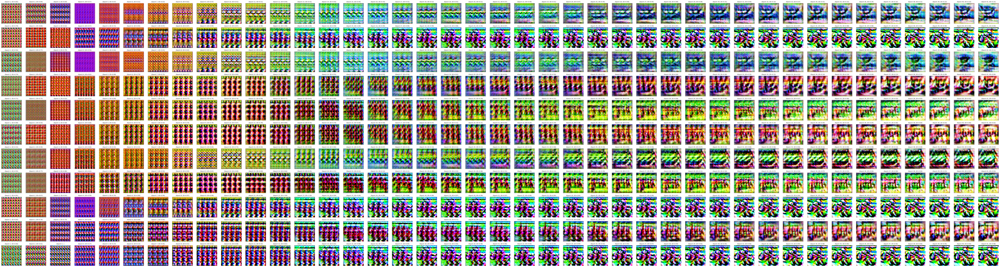

In [38]:
visualization_dir = visualization_dir
start_epoch=1
end_epoch=41

plot_epoch_class_grid(
    viz_dir= visualization_dir,
    n_classes=11,
    start_epoch=start_epoch,
    end_epoch=end_epoch,
)

##### Metrics

In [39]:
def build_metric_df(metrics_storage, metric_name, n_classes):
    """
    Convert metrics_storage into a DataFrame for one metric
    Rows = epochs, Columns = classes
    """
    data = {}
    for epoch, metrics in metrics_storage.items():
        values = metrics[metric_name]
        data[epoch+1] = values
    df = pd.DataFrame.from_dict(data, orient="index", columns=[f"Class_{i}" for i in range(n_classes)])
    df.index.name = "Epoch"
    return df

In [40]:
# Load saved metrics
metrics_storage = np.load(os.path.join(saved_model_dir, 'metrics_storage.npy'), allow_pickle=True).item()

# Build one dataframe per metric
n_classes = len(next(iter(metrics_storage.values()))["conf_mean"])  # infer class count

conf_df    = build_metric_df(metrics_storage, "conf_mean", n_classes)
ue_df      = build_metric_df(metrics_storage, "ue_mean", n_classes)
entropy_df = build_metric_df(metrics_storage, "entropy_mean", n_classes)
margin_df  = build_metric_df(metrics_storage, "margin_mean", n_classes)

# Save to CSV
conf_df.to_csv(os.path.join(saved_model_dir,'conf_mean.csv'))
ue_df.to_csv(os.path.join(saved_model_dir, 'ue_mean.csv'))
entropy_df.to_csv(os.path.join(saved_model_dir, 'entropy_mean.csv'))
margin_df.to_csv(os.path.join(saved_model_dir, 'margin_mean.csv'))

In [41]:
conf_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,0.3822,0.4277,0.6127,0.4735,0.4885,0.3111,0.9186,0.6449,0.3939,0.3669,0.9745
2,0.3472,0.4117,0.4389,0.5722,0.4562,0.6707,0.2790,0.4430,0.5290,0.4467,0.9970
3,0.5642,0.5867,0.3758,0.8309,0.5661,0.6262,0.5094,0.3718,0.5983,0.4888,1.0000
4,0.6654,0.5657,0.6857,0.6307,0.5092,0.5784,0.5812,0.5930,0.6012,0.7167,0.8590
5,0.5294,0.4916,0.5639,0.5260,0.3507,0.3835,0.7642,0.4606,0.4045,0.8731,0.8807
6,0.6651,0.2335,0.6600,0.4243,0.4185,0.4986,0.9289,0.5347,0.2668,0.9600,0.9377
7,0.5711,0.1771,0.5546,0.4891,0.5237,0.6885,0.9264,0.7133,0.2371,0.6385,0.9757
8,0.5774,0.1835,0.5242,0.4605,0.4135,0.4222,0.9684,0.7015,0.1770,0.9674,0.8964
9,0.6580,0.1489,0.6191,0.3631,0.3808,0.3827,0.4678,0.5844,0.1454,0.9783,0.7644


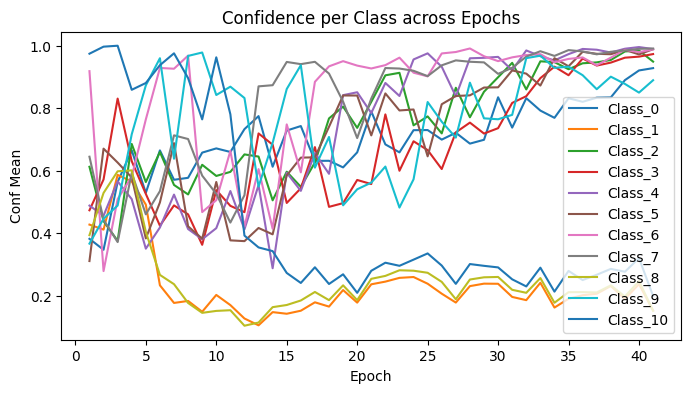

In [42]:
# Plot conf per class across epochs
plt.figure(figsize=(8,4))
for c in conf_df.columns:
    plt.plot(conf_df.index, conf_df[c], label=c)
plt.xlabel("Epoch")
plt.ylabel("Conf Mean")
plt.title("Confidence per Class across Epochs")
plt.legend()
plt.show()

In [43]:
margin_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,0.1459,0.1686,0.4413,0.2884,0.2839,0.1107,0.8955,0.4932,0.1470,0.1210,0.9683
2,0.1563,0.1530,0.1770,0.4223,0.2072,0.5454,0.0709,0.2172,0.3361,0.2280,0.9956
3,0.2913,0.3897,0.0485,0.7556,0.3304,0.4967,0.2842,0.1114,0.3369,0.1703,1.0000
4,0.4719,0.1737,0.5190,0.4468,0.2916,0.3734,0.3871,0.3911,0.3435,0.4432,0.7545
5,0.2837,0.2216,0.3040,0.3135,0.1247,0.1119,0.6530,0.1057,0.0624,0.7726,0.8099
6,0.3771,0.0283,0.3282,0.1803,0.1799,0.2890,0.8769,0.3164,0.0556,0.9460,0.8778
7,0.2775,0.0224,0.2240,0.2792,0.3229,0.5706,0.8824,0.5505,0.0753,0.4518,0.9614
8,0.2704,0.0433,0.1399,0.2487,0.1439,0.1846,0.9583,0.4695,0.0076,0.9516,0.8061
9,0.4277,0.0204,0.3176,0.0452,0.0742,0.1149,0.0952,0.3240,0.0171,0.9650,0.6275


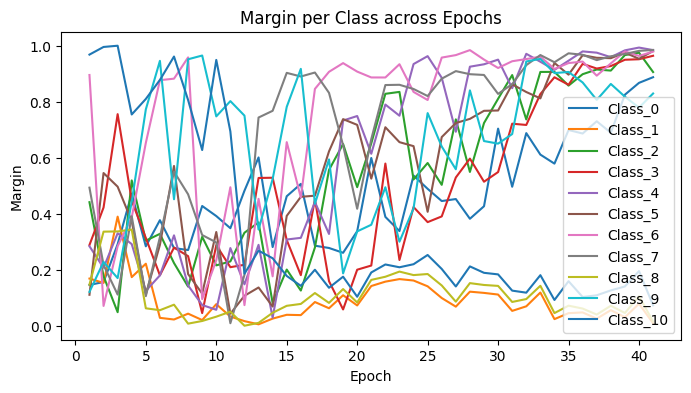

In [44]:
# Plot margin per class across epochs
plt.figure(figsize=(8,4))
for c in margin_df.columns:
    plt.plot(margin_df.index, margin_df[c], label=c)
plt.xlabel("Epoch")
plt.ylabel("Margin")
plt.title("Margin per Class across Epochs")
plt.legend()
plt.show()

In [45]:
ue_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,0.8240,0.7837,0.5575,0.7380,0.7093,0.8871,0.1484,0.5453,0.8092,0.8334,0.0552
2,0.8428,0.8045,0.7682,0.6334,0.7535,0.5357,0.8972,0.7662,0.6685,0.7622,0.0067
3,0.6415,0.6177,0.7888,0.3307,0.6346,0.5835,0.6929,0.7975,0.6077,0.6970,0.0000
4,0.5659,0.5686,0.5443,0.6053,0.7323,0.6613,0.6628,0.6217,0.5940,0.4515,0.2745
5,0.6742,0.7168,0.6449,0.6802,0.8410,0.8091,0.4350,0.7072,0.7640,0.2493,0.2393
6,0.5153,0.9268,0.4949,0.7898,0.7828,0.7331,0.1476,0.6852,0.9030,0.0857,0.1289
7,0.6290,0.9664,0.6331,0.7496,0.7192,0.5438,0.1535,0.5022,0.9411,0.6000,0.0525
8,0.6216,0.9705,0.6308,0.7692,0.7747,0.7838,0.0681,0.4958,0.9705,0.0701,0.2070
9,0.5546,0.9885,0.5738,0.7846,0.7633,0.7804,0.6895,0.6304,0.9910,0.0470,0.4342


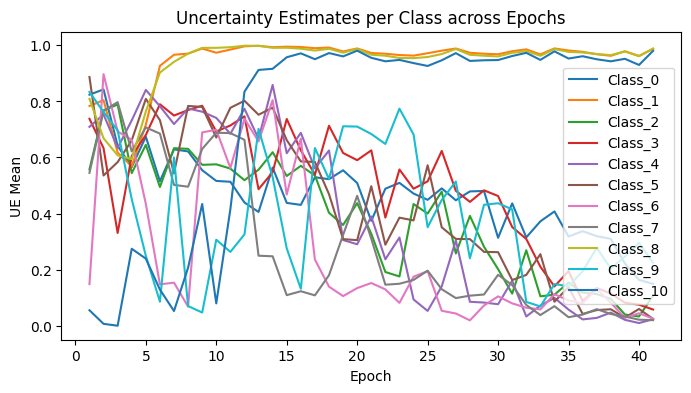

In [46]:
# Plot UE per class across epochs
plt.figure(figsize=(8,4))
for c in ue_df.columns:
    plt.plot(ue_df.index, ue_df[c], label=c)
plt.xlabel("Epoch")
plt.ylabel("UE Mean")
plt.title("Uncertainty Estimates per Class across Epochs")
plt.legend()
plt.show()

In [47]:
entropy_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,1.6483,1.4854,1.1194,1.5809,1.4758,1.9043,0.3690,1.1690,1.5702,1.6777,0.1725
2,1.7221,1.5871,1.4253,1.2964,1.3996,1.0984,1.9016,1.4908,1.2870,1.4698,0.0252
3,1.0934,1.2209,1.5113,0.7154,1.2081,1.1953,1.3529,1.4922,1.0305,1.1755,0.0000
4,1.0831,0.8176,1.0552,1.1211,1.3556,1.2145,1.2287,1.1481,1.0587,0.6385,0.5091
5,1.0745,1.2042,1.0265,1.2614,1.5742,1.4897,0.8586,1.1888,1.3964,0.4513,0.4696
6,0.8148,2.0060,0.6810,1.4378,1.3822,1.2758,0.3098,1.1508,1.9147,0.2278,0.2471
7,0.9985,2.2070,1.0259,1.3649,1.2966,0.9990,0.3563,0.9252,2.1036,1.1240,0.1407
8,1.0316,2.2385,1.0122,1.3949,1.3490,1.3799,0.1952,0.8132,2.2540,0.1875,0.3924
9,0.9185,2.3390,0.9208,1.3730,1.2848,1.3405,1.1719,1.0395,2.3546,0.1253,0.8830


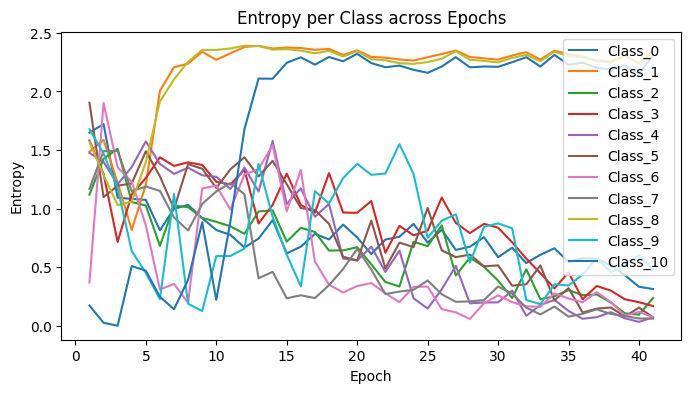

In [48]:
# Plot entropy per class across epochs
plt.figure(figsize=(8,4))
for c in entropy_df.columns:
    plt.plot(entropy_df.index, entropy_df[c], label=c)
plt.xlabel("Epoch")
plt.ylabel("Entropy")
plt.title("Entropy per Class across Epochs")
plt.legend()
plt.show()

---

##### Evaluation

In [49]:
def eval_ood_classification(model, data_loader, device, garbage_class_idx=10):
    model.eval()
    total = 0
    garbage_preds = 0

    id_confidences, id_ue, id_entropy, id_margin = [], [], [], []
    ood_confidences, ood_ue, ood_entropy, ood_margin = [], [], [], []
    all_preds = []

    with torch.no_grad():
        for images, _ in data_loader:
            images = images.to(device)
            logits, features = model(images)
            probs = F.softmax(logits, dim=1)
            confidence, preds = torch.max(probs, dim=1)
            conf, margin, ue, entropy  = compute_metrics(logits)

            for p, c,  m, u, e in zip(preds.cpu().numpy(),
                                     confidence.cpu().numpy(),
                                     margin.cpu().numpy(),
                                     ue.cpu().numpy(),
                                     entropy.cpu().numpy()):

                if p == garbage_class_idx:
                    ood_confidences.append(c)
                    ood_margin.append(m)
                    ood_ue.append(u)
                    ood_entropy.append(e)

                else:
                    id_confidences.append(c)
                    id_margin.append(m)
                    id_ue.append(u)
                    id_entropy.append(e)

                all_preds.append(p)

            garbage_preds += (preds == garbage_class_idx).sum().item()
            total += images.size(0)

    garbage_rate = garbage_preds / total

    return {
        "garbage_rate": garbage_rate,
        "all_preds": all_preds,
        "id": {
            "confidence": id_confidences,
            "ue": id_ue,
            "entropy": id_entropy,
            "margin": id_margin,},
        "ood": {
            "confidence": ood_confidences,
            "ue": ood_ue,
            "entropy": ood_entropy,
            "margin": ood_margin,}
           }

In [50]:
def garbage_rate_table(datasets_eval):
  garbage_table = pd.DataFrame({
    "Dataset": list(datasets_eval.keys()),
    "Garbage Rate (%)": [round(eval_dict['garbage_rate']*100, 3) for eval_dict in datasets_eval.values()]})

  print("Garbage Rate Table")
  display(garbage_table)

In [51]:
def metric_table(metric, datasets_eval):
  table = {
        "Dataset": [],
        "ID Min": [], "ID Max": [], "ID Mean": [], "ID Std": [],
        "OOD Min": [], "OOD Max": [], "OOD Mean": [], "OOD Std": []
    }

  for name, eval_dict in datasets_eval.items():
      id_vals  = np.array(eval_dict['id'][metric])
      ood_vals = np.array(eval_dict['ood'][metric])

      table["Dataset"].append(name)
      table["ID Min"].append(np.min(id_vals) if len(id_vals) > 0 else np.nan)
      table["ID Max"].append(np.max(id_vals) if len(id_vals) > 0 else np.nan)
      table["ID Mean"].append(np.mean(id_vals) if len(id_vals) > 0 else np.nan)
      table["ID Std"].append(np.std(id_vals) if len(id_vals) > 0 else np.nan)

      table["OOD Min"].append(np.min(ood_vals) if len(ood_vals) > 0 else np.nan)
      table["OOD Max"].append(np.max(ood_vals) if len(ood_vals) > 0 else np.nan)
      table["OOD Mean"].append(np.mean(ood_vals) if len(ood_vals) > 0 else np.nan)
      table["OOD Std"].append(np.std(ood_vals) if len(ood_vals) > 0 else np.nan)

  df = pd.DataFrame(table)
  print(f"\n Metric: {metric.upper()}")
  display(df)
  # return df

In [52]:
def garbage_rate_after_metric_threshold(model, data_loader, device, metric_name, threshold, garbage_class_idx=10):
    """Compute garbage rate given a metric and threshold"""
    model.eval()
    total = 0
    garbage_preds = 0

    with torch.no_grad():
        for images, _ in data_loader:
            images = images.to(device)
            logits, _ = model(images)
            probs = F.softmax(logits, dim=1)
            confidence, preds = torch.max(probs, dim=1)

            # Compute metrics
            conf, margin, ue, entropy = compute_metrics(logits)

            metric_values = {
                "confidence": conf,
                "margin": margin,
                "ue": ue,
                "entropy": entropy
            }[metric_name]

            for p, m in zip(preds.cpu().numpy(), metric_values.cpu().numpy()):
                # Threshold rule
                if metric_name in ["confidence", "margin"]:
                    if p != garbage_class_idx:
                      if m < threshold:
                        garbage_preds += 1
                    else:
                        garbage_preds +=1
                else:  # entropy, ue → higher = OOD
                    if p != garbage_class_idx:
                      if m > threshold:
                        garbage_preds += 1
                    else:
                        garbage_preds +=1

            total += images.size(0)

    garbage_rate = garbage_preds / total
    return garbage_rate

In [53]:
def garbage_rate_metric_threshold_table(model, datasets, device, metric_name, thresholds):
    results = []

    for t in thresholds:
        row = {"Threshold": t}
        for name, loader in datasets.items():
            rate = garbage_rate_after_metric_threshold(model, loader, device, metric_name, t)
            row[name] = rate * 100
        results.append(row)

    df = pd.DataFrame(results)

    # Format all numeric values to 2 decimal places
    df = df.round(2)

    print(f"\n Garbage Rate Table (in %): [{metric_name} Threshold]")
    display(df)

---

##### Tiny_Imagenet_200

In [ ]:
# folder_path = "/content/data/tiny-imagenet-200"
# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

Deleted folder: /content/data/tiny-imagenet-200


In [54]:
! wget http://cs231n.stanford.edu/tiny-imagenet-200.zip
! unzip tiny-imagenet-200.zip -d /content/ood_datasets

Streaming output truncated to the last 5000 lines.
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3979.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3963.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_7199.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_2752.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_9687.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_9407.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3603.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3412.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_6982.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_8496.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_7332.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_9

In [55]:
val_dir = "/content/ood_datasets/tiny-imagenet-200/val"
images_dir = os.path.join(val_dir, "images")
ann_file = os.path.join(val_dir, "val_annotations.txt")

with open(ann_file, "r") as f:
    for line in f.readlines():
        img, cls = line.strip().split("\t")[:2]
        cls_dir  = os.path.join(val_dir, cls)
        os.makedirs(cls_dir, exist_ok=True)
        shutil.move(os.path.join(images_dir, img), os.path.join(cls_dir, img))

shutil.rmtree(images_dir)

#### Using cifar10 Statistics for all ood datasets

In [56]:
# CIFAR-10 normalization stats
cifar_mean = (0.4914, 0.4822, 0.4465)
cifar_std  = (0.2470, 0.2435, 0.2616)

# Transform for grayscale datasets (MNIST, Fashion-MNIST)
ood_transform_gray = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),  # Convert to RGB
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    transforms.Normalize(cifar_mean, cifar_std)
])

# Transform for already-RGB datasets (SVHN, CIFAR-100, TinyImageNet, LSUN, CelebA)
ood_transform_rgb = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    transforms.Normalize(cifar_mean, cifar_std)
])

In [57]:
# ------------------ Grayscale datasets ------------------
mnist_testset_rgb   = datasets.MNIST(root='/content/ood_datasets/MNIST', train=False, download=True, transform=ood_transform_gray)
fmnist_testset_rgb  = datasets.FashionMNIST(root='/content/ood_datasets/FMNIST', train=False, download=True, transform=ood_transform_gray)

# ------------------ RGB datasets ------------------
svhn_testset_rgb    = datasets.SVHN(root='/content/ood_datasets/SVHN', split='test', download=True, transform=ood_transform_rgb)
cifar100_testset    = datasets.CIFAR100(root='/content/ood_datasets/CIFAR100', train=False, download=True, transform=ood_transform_rgb)

# TinyImageNet (resize to 32×32) – validation split
tinyimagenet_val    = datasets.ImageFolder(root='/content/ood_datasets/tiny-imagenet-200/val', transform=ood_transform_rgb)

# # LSUN (classroom / resize) – one or more classes
# lsun_val            = datasets.ImageFolder(root=os.path.join(lsun_data_dir, "classroom_val"), transform=ood_transform_rgb)

# CelebA – center crop then resize
# celeba_val          = datasets.CelebA(root='/content/data', split='test', download=True,
#                                       transform=transforms.Compose([
#                                           transforms.CenterCrop(148),
#                                           transforms.Resize((32, 32)),
#                                           transforms.ToTensor(),
#                                           transforms.Normalize(cifar_mean, cifar_std)
#                                       ]))

100%|██████████| 9.91M/9.91M [00:01<00:00, 6.09MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 161kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.30MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.18MB/s]
100%|██████████| 26.4M/26.4M [00:03<00:00, 8.36MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 138kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 2.44MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 20.6MB/s]
100%|██████████| 64.3M/64.3M [00:16<00:00, 3.97MB/s]
100%|██████████| 169M/169M [00:11<00:00, 15.3MB/s]


In [58]:
# ------------------ DataLoaders ------------------
batch_size = 32
mnist_loader       = DataLoader(mnist_testset_rgb,  batch_size=batch_size, shuffle=False)
fmnist_loader      = DataLoader(fmnist_testset_rgb, batch_size=batch_size, shuffle=False)
svhn_loader        = DataLoader(svhn_testset_rgb,   batch_size=batch_size, shuffle=False)
cifar100_loader    = DataLoader(cifar100_testset,   batch_size=batch_size, shuffle=False)
tiny_loader        = DataLoader(tinyimagenet_val,   batch_size=batch_size, shuffle=False)
# lsun_loader      = DataLoader(lsun_val,           batch_size=batch_size, shuffle=False)
# celeba_loader      = DataLoader(celeba_val,         batch_size=batch_size, shuffle=False)

#### Before Inversion

In [59]:
model_before_inv_pth = os.path.join(saved_model_dir, "checkpoint_csf_initial.pt")
checkpoint = torch.load(model_before_inv_pth,map_location='cpu')
nc = 3
ncf = 32

model_before_inv = Classifier(nc, ncf)
model_before_inv.load_state_dict(checkpoint['model_state_dict'])
model_before_inv.to(device)
model_before_inv.eval()

Classifier(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

In [63]:
csf_criterion_test = nn.CrossEntropyLoss()
test_loss, test_accuracy   = test(model_before_inv,  test_loader, csf_criterion_test, device)
print(f"\nTest Loss:{test_loss:.4f},  Test Accuracy: {test_accuracy:.4f}")

Testing: 100%|██████████| 313/313 [00:13<00:00, 23.26it/s, Batch Loss=1.5]


Test Loss:1.4697,  Test Accuracy: 0.4589


In [64]:
eval_cifar10    = eval_ood_classification(model_before_inv, test_loader,  device)
eval_mnist      = eval_ood_classification(model_before_inv, mnist_loader, device)
eval_fmnist     = eval_ood_classification(model_before_inv, fmnist_loader,  device)
eval_svhn       = eval_ood_classification(model_before_inv, svhn_loader,   device)
eval_cifar100   = eval_ood_classification(model_before_inv, cifar100_loader,   device)
eval_tiny_imagenet200  = eval_ood_classification(model_before_inv, tiny_loader, device)
# eval_celeba     = eval_ood_classification(model_before_inv, celeba_loader,   device)

In [65]:
# List of datasets
datasets_eval = {
    "CIFAR-10": eval_cifar10,
    "MNIST": eval_mnist,
    "FashionMNIST": eval_fmnist,
    "SVHN": eval_svhn,
    "CIFAR-100": eval_cifar100,
    "TinyImageNet200": eval_tiny_imagenet200,
    # "CelebA": eval_celeba,
}

In [66]:
garbage_rate_table(datasets_eval)

Garbage Rate Table


,Dataset,Garbage Rate (%)
0,CIFAR-10,0.02
1,MNIST,0.00
2,FashionMNIST,0.07
3,SVHN,0.00
4,CIFAR-100,0.05
5,TinyImageNet200,0.05


In [69]:
metric_table('ue',datasets_eval)


 Metric: UE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.191200,0.989020,0.788261,0.135565,0.704781,0.912046,0.808413,0.103633
1,MNIST,0.493312,0.983818,0.838234,0.096347,NaN,NaN,NaN,NaN
2,FashionMNIST,0.177109,0.988148,0.677913,0.140522,0.105942,0.942768,0.648980,0.286696
3,SVHN,0.405410,0.979904,0.821869,0.073984,NaN,NaN,NaN,NaN
4,CIFAR-100,0.188013,0.989364,0.832173,0.112597,0.108562,0.971355,0.717947,0.312842
5,TinyImageNet200,0.244890,0.989262,0.829793,0.113857,0.864105,0.956082,0.920354,0.033692


In [70]:
metric_table('entropy',datasets_eval)


 Metric: ENTROPY


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.375472,2.318490,1.596699,0.378825,1.490637,2.059742,1.775190,0.284552
1,MNIST,0.860897,2.294243,1.738923,0.312653,NaN,NaN,NaN,NaN
2,FashionMNIST,0.376158,2.322934,1.283774,0.391873,0.302786,2.142462,1.478175,0.624644
3,SVHN,0.673430,2.272981,1.631839,0.223703,NaN,NaN,NaN,NaN
4,CIFAR-100,0.449790,2.338626,1.724690,0.340964,0.290354,2.258411,1.615176,0.691270
5,TinyImageNet200,0.517090,2.336375,1.719192,0.345726,1.851632,2.205189,2.061661,0.123818


In [67]:
metric_table('confidence',datasets_eval)


 Metric: CONFIDENCE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.132077,0.905915,0.405572,0.148427,0.313335,0.561869,0.437602,0.124267
1,MNIST,0.143442,0.709451,0.360797,0.115532,NaN,NaN,NaN,NaN
2,FashionMNIST,0.132582,0.914260,0.523153,0.144218,0.235200,0.950453,0.566419,0.235194
3,SVHN,0.162256,0.772268,0.369039,0.086653,NaN,NaN,NaN,NaN
4,CIFAR-100,0.124578,0.909684,0.358456,0.127056,0.181213,0.949017,0.479954,0.259534
5,TinyImageNet200,0.123914,0.879327,0.361301,0.128959,0.203118,0.371755,0.290427,0.061803


In [68]:
metric_table('margin',datasets_eval)


 Metric: MARGIN


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.000017,0.858129,0.165540,0.163883,0.103111,0.378124,0.240617,0.137506
1,MNIST,0.000022,0.495047,0.124257,0.090308,NaN,NaN,NaN,NaN
2,FashionMNIST,0.000003,0.868675,0.263399,0.162843,0.024953,0.939903,0.468744,0.291029
3,SVHN,0.000009,0.587261,0.114204,0.087181,NaN,NaN,NaN,NaN
4,CIFAR-100,0.000008,0.883147,0.123884,0.128367,0.019558,0.925621,0.346555,0.308624
5,TinyImageNet200,0.000006,0.823065,0.126006,0.131520,0.052605,0.230796,0.128899,0.068952


### After Inversion

##### Evaluating the model with best test accuracy

In [71]:
model_after_inv_pth = os.path.join(saved_model_dir,'csf_model.pth')
nc = 3
ncf = 32

model_after_inv = Classifier(nc, ncf)
model_after_inv.load_state_dict(torch.load(model_after_inv_pth, map_location=device))
model_after_inv.to(device)
model_after_inv.eval()

Classifier(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

In [72]:
csf_criterion_test = nn.CrossEntropyLoss()
test_loss, test_accuracy   = test(model_after_inv,  test_loader, csf_criterion_test, device)
print(f"\nTest Loss:{test_loss:.4f},  Test Accuracy: {test_accuracy:.4f}")

Testing: 100%|██████████| 313/313 [00:15<00:00, 20.86it/s, Batch Loss=0.341]


Test Loss:0.6646,  Test Accuracy: 0.7748


In [73]:
eval_cifar10    = eval_ood_classification(model_after_inv, test_loader,  device)
eval_mnist      = eval_ood_classification(model_after_inv, mnist_loader, device)
eval_fmnist     = eval_ood_classification(model_after_inv, fmnist_loader,  device)
eval_svhn       = eval_ood_classification(model_after_inv, svhn_loader,   device)
eval_cifar100   = eval_ood_classification(model_after_inv, cifar100_loader,   device)
eval_tiny_imagenet200  = eval_ood_classification(model_after_inv, tiny_loader, device)
# eval_celeba     = eval_ood_classification(model_before_inv, celeba_loader,   device)

In [74]:
# List of datasets
datasets_eval = {
    "CIFAR-10": eval_cifar10,
    "MNIST": eval_mnist,
    "FashionMNIST": eval_fmnist,
    "SVHN": eval_svhn,
    "CIFAR-100": eval_cifar100,
    "TinyImageNet200": eval_tiny_imagenet200,
    # "CelebA": eval_celeba,
}

In [75]:
garbage_rate_table(datasets_eval)

Garbage Rate Table


,Dataset,Garbage Rate (%)
0,CIFAR-10,0.00
1,MNIST,0.00
2,FashionMNIST,0.00
3,SVHN,0.00
4,CIFAR-100,0.03
5,TinyImageNet200,0.06


In [78]:
metric_table('ue',datasets_eval)


 Metric: UE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.000001,0.960071,0.348557,0.286524,NaN,NaN,NaN,NaN
1,MNIST,0.000271,0.935188,0.427117,0.259910,NaN,NaN,NaN,NaN
2,FashionMNIST,0.000567,0.957121,0.538279,0.264145,NaN,NaN,NaN,NaN
3,SVHN,0.002894,0.939600,0.569479,0.188936,NaN,NaN,NaN,NaN
4,CIFAR-100,0.000535,0.972336,0.596447,0.226877,0.126654,0.88846,0.390437,0.352361
5,TinyImageNet200,0.000006,0.972817,0.601084,0.231313,0.009523,0.89256,0.588850,0.300124


In [79]:
metric_table('entropy',datasets_eval)


 Metric: ENTROPY


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.000011,2.160606,0.638115,0.518015,NaN,NaN,NaN,NaN
1,MNIST,0.001247,1.983134,0.775745,0.465303,NaN,NaN,NaN,NaN
2,FashionMNIST,0.002736,2.143577,1.023343,0.496173,NaN,NaN,NaN,NaN
3,SVHN,0.011301,2.043490,1.002396,0.326567,NaN,NaN,NaN,NaN
4,CIFAR-100,0.002484,2.231943,1.113833,0.448113,0.241401,1.841781,0.821418,0.723755
5,TinyImageNet200,0.000041,2.214859,1.129105,0.458632,0.029193,1.906913,1.110315,0.642755


In [76]:
metric_table('confidence',datasets_eval)


 Metric: CONFIDENCE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.183802,0.999999,0.770176,0.216374,NaN,NaN,NaN,NaN
1,MNIST,0.195519,0.999877,0.717256,0.207022,NaN,NaN,NaN,NaN
2,FashionMNIST,0.170916,0.999742,0.633972,0.216838,NaN,NaN,NaN,NaN
3,SVHN,0.214268,0.998684,0.608457,0.169628,NaN,NaN,NaN,NaN
4,CIFAR-100,0.176607,0.999757,0.585923,0.197534,0.279889,0.938788,0.714725,0.307523
5,TinyImageNet200,0.149815,0.999997,0.581303,0.200624,0.308838,0.995653,0.548028,0.246071


In [77]:
metric_table('margin',datasets_eval)


 Metric: MARGIN


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,CIFAR-10,0.000019,0.999999,0.634790,0.332775,NaN,NaN,NaN,NaN
1,MNIST,0.000192,0.999755,0.548321,0.317283,NaN,NaN,NaN,NaN
2,FashionMNIST,0.000021,0.999644,0.458429,0.314547,NaN,NaN,NaN,NaN
3,SVHN,0.000012,0.998132,0.375720,0.263688,NaN,NaN,NaN,NaN
4,CIFAR-100,0.000010,0.999592,0.375618,0.280180,0.057984,0.898243,0.611849,0.391718
5,TinyImageNet200,0.000005,0.999995,0.372912,0.283206,0.003802,0.991518,0.295131,0.359764


#### Applying Threshold

In [80]:
datasets = {
    "CIFAR10": test_loader,
    "MNIST": mnist_loader,
    "FashionMNIST": fmnist_loader,
    "SVHN": svhn_loader,
    "CIFAR-100": cifar100_loader,
    "TinyImageNet200": tiny_loader,
    # "CelebA": celeba_loader,
}

##### UE Threshold

In [81]:
ue_thresholds = [0.1,0.5,0.8]

In [171]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"ue", ue_thresholds)


 Garbage Rate Table (in %): [ue Threshold]


,Threshold,CIFAR10,MNIST,FashionMNIST,SVHN,CIFAR-100,TinyImageNet200
0,0.1,100.00,100.00,100.00,100.00,100.00,100.00
1,0.5,96.06,99.98,92.20,99.92,98.62,98.60
2,0.8,55.47,67.07,22.43,70.37,70.06,68.31


In [172]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"ue", ue_thresholds)


 Garbage Rate Table (in %): [ue Threshold]


,Threshold,CIFAR10,MNIST,FashionMNIST,SVHN,CIFAR-100,TinyImageNet200
0,0.1,68.87,84.93,89.28,97.98,95.89,95.39
1,0.5,36.16,44.63,62.88,70.90,71.97,72.83
2,0.8,5.89,7.34,15.69,4.81,19.05,20.73


##### Conf_Threshold

In [82]:
conf_thresholds = [0.7,0.8,0.9,0.95]

In [ ]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"confidence", conf_thresholds)

In [ ]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"confidence", conf_thresholds)

##### Margin_Threshold

In [ ]:
margin_thresholds = [0.6, 0.7, 0.8, 0.9]

In [ ]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"margin", margin_thresholds)

In [ ]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"margin", margin_thresholds)

##### Entropy_Threshold

In [ ]:
entropy_thresholds = [0.5,0.6,0.8,0.9]

In [ ]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"entropy", entropy_thresholds)

In [ ]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"entropy", entropy_thresholds)

In [ ]:
checkpoint_no = 50
model_ckpt_pth = os.path.join(saved_model_dir,f'checkpoint_epoch_{checkpoint_no}.pt')
nc = 3
ncf = 32

checkpoint = torch.load(model_ckpt_pth, map_location=device)

model_ckpt = Classifier(nc, ncf)
model_ckpt.load_state_dict(checkpoint['csf_state_dict'])
model_ckpt.to(device)
model_ckpt.eval()

In [ ]:
csf_criterion_test = nn.CrossEntropyLoss()
test_loss, test_accuracy   = test(model_ckpt,  test_loader, csf_criterion_test, device)
print(f"\nTest Loss:{test_loss:.4f},  Test Accuracy: {test_accuracy:.4f}")

In [ ]:
eval_cifar10    = eval_ood_classification(model_ckpt, test_loader,  device)
eval_mnist      = eval_ood_classification(model_ckpt, mnist_loader, device)
eval_fmnist     = eval_ood_classification(model_ckpt, fmnist_loader,  device)
eval_svhn       = eval_ood_classification(model_ckpt, svhn_loader,   device)
eval_cifar100   = eval_ood_classification(model_ckpt, cifar100_loader,   device)
eval_tiny_imagenet200  = eval_ood_classification(model_ckpt, tiny_loader, device)
# eval_celeba     = eval_ood_classification(model_before_inv, celeba_loader,   device)

In [ ]:
# List of datasets
datasets_eval = {
    "CIFAR-10": eval_cifar10,
    "MNIST": eval_mnist,
    "FashionMNIST": eval_fmnist,
    "SVHN": eval_svhn,
    "CIFAR-100": eval_cifar100,
    "TinyImageNet200": eval_tiny_imagenet200,
    # "CelebA": eval_celeba,
}

In [ ]:
garbage_rate_table(datasets_eval)

In [ ]:
metric_table('confidence',datasets_eval)

In [ ]:
metric_table('margin',datasets_eval)

In [ ]:
metric_table('ue',datasets_eval)

In [ ]:
metric_table('entropy',datasets_eval)

---

### AUROC, AUPR, FPR@95TPR
* AUROC (Area Under ROC Curve) → measures overall separability between ID vs OOD.

* AUPR (Area Under Precision-Recall Curve) → emphasizes precision when positives are rare.

* FPR@95TPR → false positive rate when true positive rate = 95%.

##### Helper Functions

In [90]:
def compute_auroc_aupr_fpr95(id_scores, ood_scores):
    """
    Compute AUROC, AUPR, and FPR@95TPR
    Label convention: 0 = ID, 1 = OOD
    """
    y_true  = np.concatenate([np.zeros_like(id_scores), np.ones_like(ood_scores)])
    y_score = np.concatenate([id_scores, ood_scores])

    # AUROC
    try:
        auroc = roc_auc_score(y_true, y_score)
    except:
        auroc = np.nan

    # AUPR
    try:
        precision, recall, _ = precision_recall_curve(y_true, y_score)
        aupr = auc(recall, precision)
    except:
        aupr = np.nan

    # FPR@95TPR
    try:
        fpr, tpr, _ = roc_curve(y_true, y_score)
        idx = np.where(tpr >= 0.95)[0]
        fpr95 = fpr[idx[0]] if len(idx) > 0 else 1.0
    except:
        fpr95 = np.nan

    return round(auroc, 4), round(aupr, 4), round(fpr95, 4), fpr, tpr, precision, recall

In [91]:
def compute_mahalanobis_stats(model, loader, device):
    model.eval()
    all_feats, all_labels = [], []

    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            _,feats = model(x)
            all_feats.append(feats)
            all_labels.append(y)

    feats = torch.cat(all_feats)
    labels = torch.cat(all_labels)
    num_classes = len(torch.unique(labels))

    class_means = []
    for c in range(num_classes):
        class_feats = feats[labels == c]
        class_means.append(class_feats.mean(0))

    cov = torch.cov(feats.T)
    cov_inv = torch.inverse(cov + 1e-5 * torch.eye(cov.shape[0], device=device))

    return class_means, cov_inv

In [92]:
# Mahalanobis (requires precomputed class means + covariance inverse)
def score_mahalanobis(features, class_means, cov_inv):
    dists = []
    for mu_c in class_means:
        diff = features - mu_c
        dist = torch.einsum('bi,ij,bj->b', diff, cov_inv, diff)
        dists.append(dist)
    return -torch.min(torch.stack(dists, dim=1), dim=1)[0]  # negative = higher confidence

In [93]:
def get_metric_scores(exclude_garbage, model, data_loader, device, metric_name, temperature=1.0,
                               class_means=None, cov_inv=None):
    """
    Get metric scores for a dataset.
    Supports: confidence, margin, ue, entropy, energy, msp, odin, mahalanobis
    """
    model.eval()
    metric_scores = []

    with torch.no_grad():
        for images, _ in data_loader:
            images = images.to(device)
            logits, feats = model(images)

            if exclude_garbage:
                logits = logits[:, :10]

            if metric_name in ["confidence", "margin", "ue", "entropy"]:
                confidence, margin, ue, entropy = compute_metrics(logits)
                metric_values = {
                    "confidence": confidence,
                    "margin": margin,
                    "ue": ue,
                    "entropy": entropy
                }[metric_name]

            elif metric_name == "energy":
                metric_values = -temperature * torch.logsumexp(logits / temperature, dim=1)

            elif metric_name == "msp":
                metric_values = torch.max(F.softmax(logits, dim=1), dim=1)[0]

            elif metric_name == "odin":
                metric_values = torch.max(F.softmax(logits / temperature, dim=1), dim=1)[0]

            elif metric_name == "mahalanobis":
                if class_means is None or cov_inv is None:
                    raise ValueError("class_means and cov_inv must be provided for Mahalanobis score")
                metric_values = score_mahalanobis(feats, class_means, cov_inv)

            else:
                raise ValueError(f"Unknown metric_name: {metric_name}")

            metric_scores.extend(metric_values.cpu().numpy())

    return np.array(metric_scores)

In [94]:
def comprehensive_ood_analysis(exclude_garbage, model, datasets, device, metric_name, id_name,
                                        temperature=1.0, class_means=None, cov_inv=None):
    """
    Comprehensive OOD analysis supporting multiple metrics including Mahalanobis.
    """
    if exclude_garbage:
        print(f"COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - {metric_name.upper()}")
    else:
        print(f"COMPREHENSIVE OOD ANALYSIS (Garbage class included) - {metric_name.upper()}")

    # Get ID scores
    id_scores = get_metric_scores(exclude_garbage, model, datasets[id_name], device,
                                           metric_name, temperature, class_means, cov_inv)

    results = []

    for ood_name, ood_loader in datasets.items():
        if ood_name == id_name:
            continue

        ood_scores = get_metric_scores(exclude_garbage, model, ood_loader, device,
                                                metric_name, temperature, class_means, cov_inv)

        flip_sign = -1 if metric_name in ["msp", "odin", "mahalanobis"] else 1
        id_eval = id_scores * flip_sign
        ood_eval = ood_scores * flip_sign

        auroc, aupr, fpr_95tpr, fpr, tpr, precision, recall = compute_auroc_aupr_fpr95(id_eval, ood_eval)
        id_mean = np.mean(id_scores)
        ood_mean = np.mean(ood_scores)
        separation = abs(id_mean - ood_mean)

        results.append({
            'OOD Dataset': ood_name,
            'AUROC': auroc,
            'AUPR': aupr,
            'FPR@95TPR': fpr_95tpr,
            f'ID {metric_name} Mean': round(id_mean, 4),
            f'OOD {metric_name} Mean': round(ood_mean, 4),
            'Separation': round(separation, 4),
            'FPR_curve': fpr,
            'TPR_curve': tpr,
            'Precision_curve': precision,
            'Recall_curve': recall,
            'ID_scores': id_scores,
            'OOD_scores':ood_scores
        })

    df_summary = pd.DataFrame([{k: r[k] for k in ['OOD Dataset', 'AUROC', 'AUPR', 'FPR@95TPR',
                                                  f'ID {metric_name} Mean', f'OOD {metric_name} Mean',
                                                  'Separation']} for r in results])
    display(df_summary)
    print(f"\nAvg AUROC = {df_summary['AUROC'].mean():.4f} | "
          f"Avg AUPR = {df_summary['AUPR'].mean():.4f} | "
          f"Avg FPR@95TPR = {df_summary['FPR@95TPR'].mean():.4f}")

    return df_summary, results

In [95]:
def plot_ood_metrics(df, metric_name):
    """
    Plots AUROC, AUPR, and FPR@95TPR results for OOD analysis
    """
    sns.set(style="whitegrid", font_scale=1.1)
    fig, axes = plt.subplots(1, 3, figsize=(25, 6))

    # --- AUROC ---
    sns.barplot(
        data=df,
        x="OOD Dataset",
        y="AUROC",
        ax=axes[0],
        palette="Blues_d",
        hue = "OOD Dataset",
        legend=False
    )
    axes[0].set_title(f"{metric_name.upper()} - AUROC", fontsize=14, fontweight='bold')
    axes[0].set_ylim(0, 1)
    for i, val in enumerate(df["AUROC"]):
        axes[0].text(i, val + 0.02, f"{val:.3f}", ha='center', fontsize=10)

    # --- AUPR ---
    sns.barplot(
        data=df,
        x="OOD Dataset",
        y="AUPR",
        ax=axes[1],
        palette="Greens_d",
         hue = "OOD Dataset",
        legend=False
    )
    axes[1].set_title(f"{metric_name.upper()} - AUPR", fontsize=14, fontweight='bold')
    axes[1].set_ylim(0, 1)
    for i, val in enumerate(df["AUPR"]):
        axes[1].text(i, val + 0.02, f"{val:.3f}", ha='center', fontsize=10)

    # --- FPR@95TPR ---
    sns.barplot(
        data=df,
        x="OOD Dataset",
        y="FPR@95TPR",
        ax=axes[2],
        palette="Reds_d",
        hue = "OOD Dataset",
        legend=False
    )
    axes[2].set_title(f"{metric_name.upper()} - FPR@95TPR", fontsize=14, fontweight='bold')
    axes[2].set_ylim(0, 1)
    for i, val in enumerate(df["FPR@95TPR"]):
        axes[2].text(i, val + 0.02, f"{val:.3f}", ha='center', fontsize=10)

    plt.tight_layout()
    plt.show()

In [96]:
def plot_ood_curves(results, metric_name):
    """
    Plots ROC and PR curves for each OOD dataset.
    """
    sns.set(style="whitegrid", font_scale=1.1)
    fig, axes = plt.subplots(1, 2, figsize=(25, 6))

    # --- ROC Curves ---
    for res in results:
        axes[0].plot(
            res['FPR_curve'], res['TPR_curve'],
            label=f"{res['OOD Dataset']} (AUROC={res['AUROC']:.3f})"
        )
    axes[0].plot([0, 1], [0, 1], 'k--', lw=1)
    axes[0].set_title(f"{metric_name.upper()} - ROC Curve", fontsize=14, fontweight='bold')
    axes[0].set_xlabel("False Positive Rate")
    axes[0].set_ylabel("True Positive Rate")
    axes[0].legend()
    axes[0].grid(True)

    # --- Precision-Recall Curves ---
    for res in results:
        axes[1].plot(
            res['Recall_curve'], res['Precision_curve'],
            label=f"{res['OOD Dataset']} (AUPR={res['AUPR']:.3f})"
        )
    axes[1].set_title(f"{metric_name.upper()} - Precision-Recall Curve", fontsize=14, fontweight='bold')
    axes[1].set_xlabel("Recall")
    axes[1].set_ylabel("Precision")
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


In [97]:
def plot_metric_comparison(df, metric_label):
    df_melt = df.melt(id_vars="OOD Dataset", var_name="Method", value_name=metric_label)
    plt.figure(figsize=(8,4))
    sns.barplot(data=df_melt, x="OOD Dataset", y=metric_label, hue="Method")
    plt.title(f"{metric_label} Comparison Across Methods", fontsize=14, fontweight='bold')
    plt.ylim(0,1)
    plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
    plt.show()

In [98]:
def plot_separation_for_method(results, method_name, target_tpr=0.95, bins=50):
    """
    Plots score separation for a method across all OOD datasets (like Energy paper).

    Parameters:
        results: list of dicts returned by comprehensive_ood_analysis_with_scores
        method_name: str, name of the metric
        target_tpr: float, TPR to compute threshold
        bins: int, histogram bins
    """
    num_ood = len(results)
    fig, axes = plt.subplots(1, num_ood, figsize=(6*num_ood, 5), sharey=True)

    if num_ood == 1:
        axes = [axes]

    for ax, res in zip(axes, results):

        id_scores  = res['ID_scores']
        ood_scores = res['OOD_scores']

        flip_sign=-1 if method_name in ["msp","odin","mahalanobis"] else 1
        id_scores  = flip_sign*id_scores
        ood_scores = flip_sign*ood_scores

        # Compute threshold for target TPR
        y_true = np.concatenate([np.zeros_like(id_scores), np.ones_like(ood_scores)])
        y_score = np.concatenate([id_scores, ood_scores])
        fpr, tpr, thresholds = roc_curve(y_true, y_score)
        idx = np.where(tpr >= target_tpr)[0]
        threshold = thresholds[idx[0]] if len(idx) > 0 else thresholds[-1]

        # Plot ID and OOD distributions
        sns.histplot(id_scores, color='blue', kde=True, stat='density', bins=bins, alpha=0.6, ax=ax, label='ID')
        sns.histplot(ood_scores, color='red', kde=True, stat='density', bins=bins, alpha=0.6, ax=ax, label='OOD')
        ax.axvline(threshold, color='black', linestyle='--', label=f'Threshold (TPR={target_tpr*100:.0f}%, Threshold={threshold:0.6f})')
        ax.set_title(res['OOD Dataset'], fontsize=14, fontweight='bold')
        ax.set_xlabel("Score")
        ax.set_ylabel("Density")
        ax.legend()

    plt.suptitle(f"Score Separation - {method_name}", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

##### Excluding Garbage class

In [99]:
datasets = {
    "CIFAR10": test_loader,
    "MNIST": mnist_loader,
    "FashionMNIST": fmnist_loader,
    "SVHN": svhn_loader,
    "CIFAR-100": cifar100_loader,
    "TinyImageNet200": tiny_loader,
    # "CelebA": celeba_loader,
}

In [100]:
model_after_inv_pth = os.path.join(saved_model_dir,'csf_model.pth')
nc = 3
ncf = 32

model_after_inv = Classifier(nc, ncf)
model_after_inv.load_state_dict(torch.load(model_after_inv_pth, map_location=device))
model_after_inv.to(device)
model_after_inv.eval()

Classifier(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

In [101]:
id_name = "CIFAR10"

In [102]:
# Compute class statistics from ID dataset(for mahalanobis)
class_means, cov_inv = compute_mahalanobis_stats(model_after_inv, datasets[id_name], device)

In [103]:
exclude_garbage = True
temperature = 1000.0

###### UE

In [104]:
metric = "ue"

In [105]:
df_ue, results_ue = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - UE


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID ue Mean,OOD ue Mean,Separation
0,MNIST,0.5925,0.5489,0.7795,0.3521,0.4314,0.0794
1,FashionMNIST,0.6893,0.6574,0.8196,0.3521,0.5437,0.1916
2,SVHN,0.7221,0.8071,0.6079,0.3521,0.5752,0.2232
3,CIFAR-100,0.7451,0.7023,0.6632,0.3521,0.6023,0.2502
4,TinyImageNet200,0.7488,0.7110,0.6774,0.3521,0.6069,0.2549



Avg AUROC = 0.6996 | Avg AUPR = 0.6853 | Avg FPR@95TPR = 0.7095


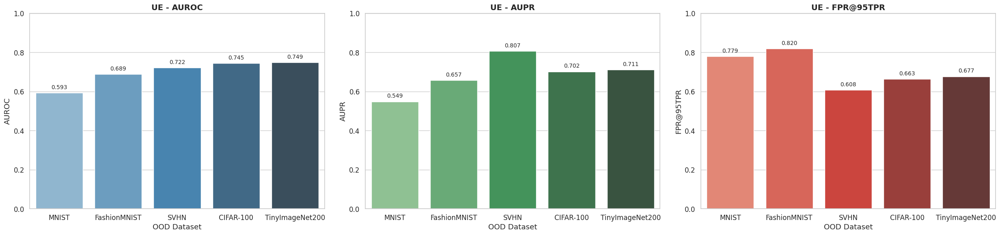

In [106]:
plot_ood_metrics(df_ue, metric)

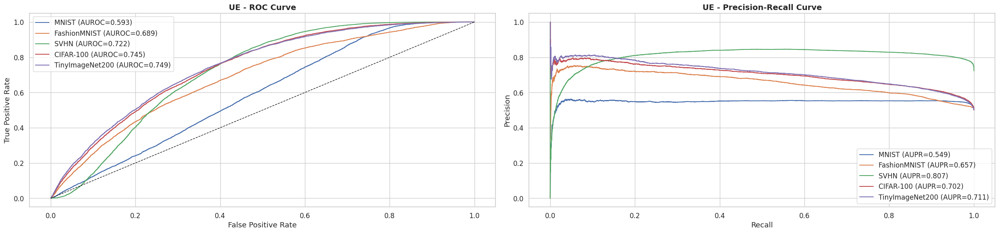

In [107]:
plot_ood_curves(results_ue, metric)

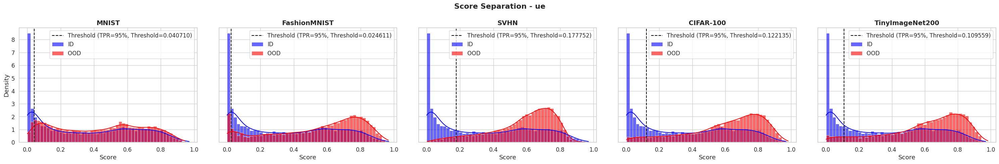

In [108]:
plot_separation_for_method(results_ue, method_name="ue", target_tpr=0.95)

###### MSP(Max-Softmax Probability)

In [109]:
metric = "msp"

In [110]:
df_msp, results_msp = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name= id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - MSP


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID msp Mean,OOD msp Mean,Separation
0,MNIST,0.5936,0.5506,0.7803,0.7702,0.7173,0.0529
1,FashionMNIST,0.6789,0.6450,0.8197,0.7702,0.6340,0.1362
2,SVHN,0.7247,0.8174,0.6086,0.7702,0.6085,0.1617
3,CIFAR-100,0.7383,0.6915,0.6629,0.7702,0.5860,0.1842
4,TinyImageNet200,0.7410,0.6995,0.6774,0.7702,0.5815,0.1887



Avg AUROC = 0.6953 | Avg AUPR = 0.6808 | Avg FPR@95TPR = 0.7098


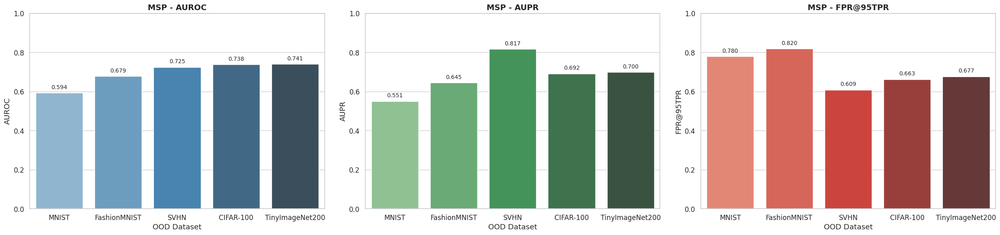

In [111]:
plot_ood_metrics(df_msp, metric)

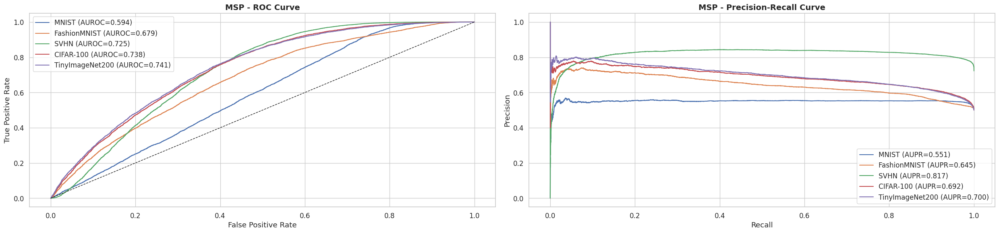

In [112]:
plot_ood_curves(results_msp, metric)

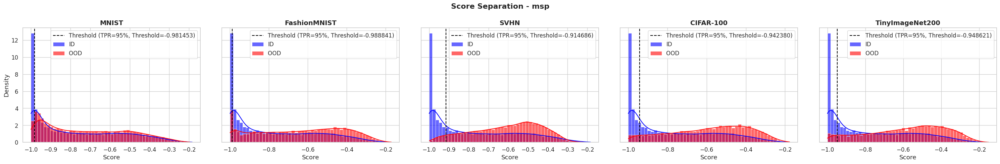

In [113]:
plot_separation_for_method(results_msp, method_name=metric, target_tpr=0.95)

###### ODIN(Out-of-distrbution detector for Neural Networks)

In [114]:
metric = "odin"

In [115]:
df_odin, results_odin = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - ODIN


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID odin Mean,OOD odin Mean,Separation
0,MNIST,0.6109,0.5541,0.7518,0.1007,0.1006,0.0001
1,FashionMNIST,0.7461,0.7023,0.7057,0.1007,0.1005,0.0002
2,SVHN,0.6819,0.7715,0.6306,0.1007,0.1005,0.0002
3,CIFAR-100,0.7602,0.7190,0.6619,0.1007,0.1004,0.0003
4,TinyImageNet200,0.7712,0.7361,0.6663,0.1007,0.1004,0.0003



Avg AUROC = 0.7141 | Avg AUPR = 0.6966 | Avg FPR@95TPR = 0.6833


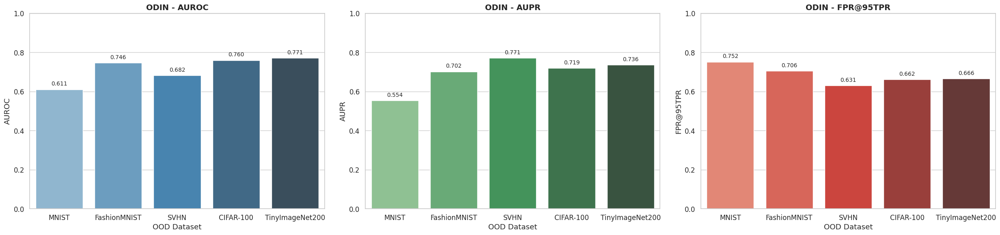

In [116]:
plot_ood_metrics(df_odin, metric)

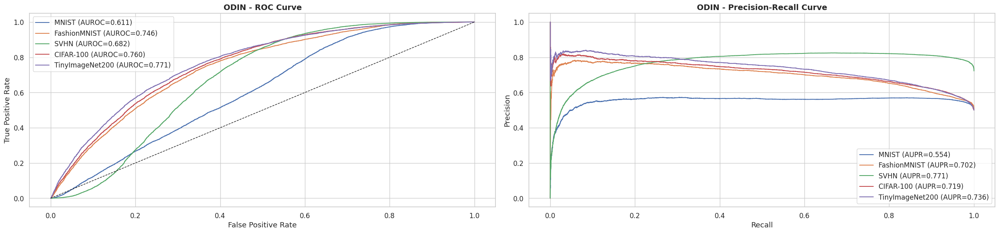

In [117]:
plot_ood_curves(results_odin, metric)

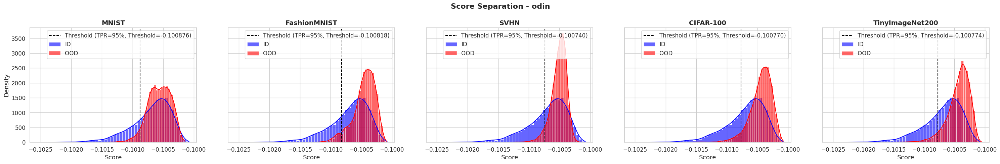

In [118]:
plot_separation_for_method(results_odin, method_name=metric, target_tpr=0.95)

###### Energy

In [119]:
metric = "energy"

In [120]:
df_energy, results_energy = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - ENERGY


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID energy Mean,OOD energy Mean,Separation
0,MNIST,0.5417,0.4857,0.7760,-5.1689,-4.4862,0.6827
1,FashionMNIST,0.7228,0.6745,0.7275,-5.1689,-3.5909,1.5781
2,SVHN,0.7481,0.8268,0.5758,-5.1689,-3.4419,1.7271
3,CIFAR-100,0.7539,0.7142,0.6712,-5.1689,-3.4370,1.7320
4,TinyImageNet200,0.7670,0.7328,0.6708,-5.1689,-3.3772,1.7917



Avg AUROC = 0.7067 | Avg AUPR = 0.6868 | Avg FPR@95TPR = 0.6843


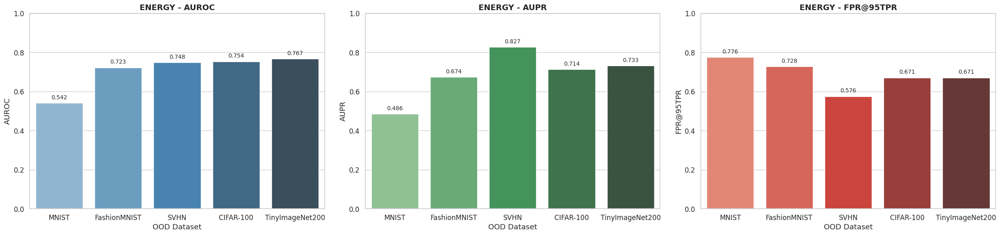

In [121]:
plot_ood_metrics(df_energy, metric)

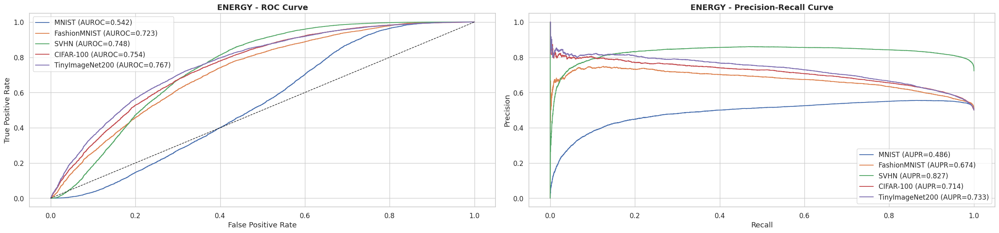

In [122]:
plot_ood_curves(results_energy, metric)

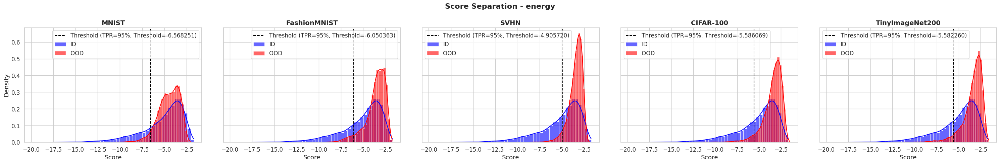

In [123]:
plot_separation_for_method(results_energy, method_name=metric, target_tpr=0.95)

###### Mahalanobis

In [124]:
metric = "mahalanobis"

In [125]:
df_maha, results_maha = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - MAHALANOBIS


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID mahalanobis Mean,OOD mahalanobis Mean,Separation
0,MNIST,0.9729,0.9695,0.1216,-121.551903,-362.124390,240.572495
1,FashionMNIST,0.8527,0.8458,0.5314,-121.551903,-241.878601,120.326599
2,SVHN,0.4810,0.7000,0.9056,-121.551903,-116.848000,4.703900
3,CIFAR-100,0.5190,0.5346,0.9445,-121.551903,-130.237198,8.685300
4,TinyImageNet200,0.4948,0.5101,0.9476,-121.551903,-124.656403,3.104500



Avg AUROC = 0.6641 | Avg AUPR = 0.7120 | Avg FPR@95TPR = 0.6901


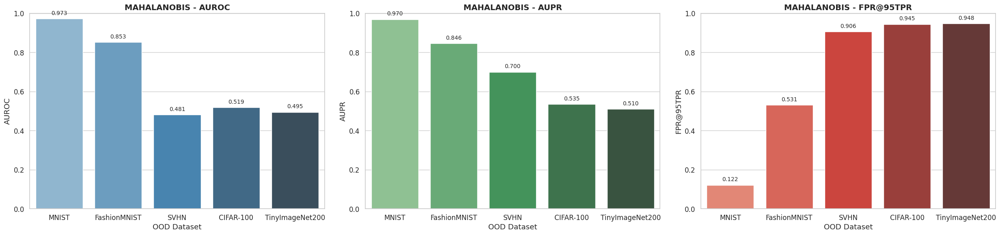

In [126]:
plot_ood_metrics(df_maha, metric)

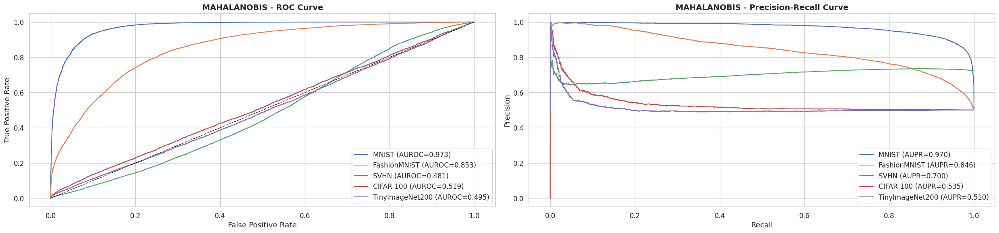

In [127]:
plot_ood_curves(results_maha, metric)

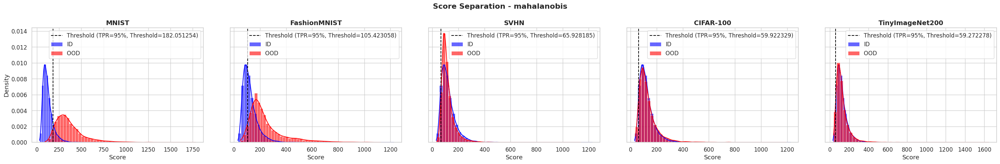

In [128]:
plot_separation_for_method(results_maha, method_name=metric, target_tpr=0.95)

###### Comparison

In [129]:
metric_dfs = {
    "UE": df_ue,
    "MSP": df_msp,
    "ODIN": df_odin,
    "Energy": df_energy,
    "Mahalanobis": df_maha
}

# Initialize empty dicts to store AUROC, AUPR, FPR separately
auroc_df, aupr_df, fpr95_df = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

for metric_name, df in metric_dfs.items():
    temp_df = df.set_index("OOD Dataset")
    auroc_df[metric_name] = temp_df["AUROC"]
    aupr_df[metric_name] = temp_df["AUPR"]
    fpr95_df[metric_name] = temp_df["FPR@95TPR"]

# Reset index so OOD Dataset is a column
auroc_df = auroc_df.reset_index()
aupr_df = aupr_df.reset_index()
fpr95_df = fpr95_df.reset_index()

In [130]:
print("=== AUROC Comparison ===")
display(auroc_df)

=== AUROC Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.5925,0.5936,0.6109,0.5417,0.9729
1,FashionMNIST,0.6893,0.6789,0.7461,0.7228,0.8527
2,SVHN,0.7221,0.7247,0.6819,0.7481,0.4810
3,CIFAR-100,0.7451,0.7383,0.7602,0.7539,0.5190
4,TinyImageNet200,0.7488,0.7410,0.7712,0.7670,0.4948


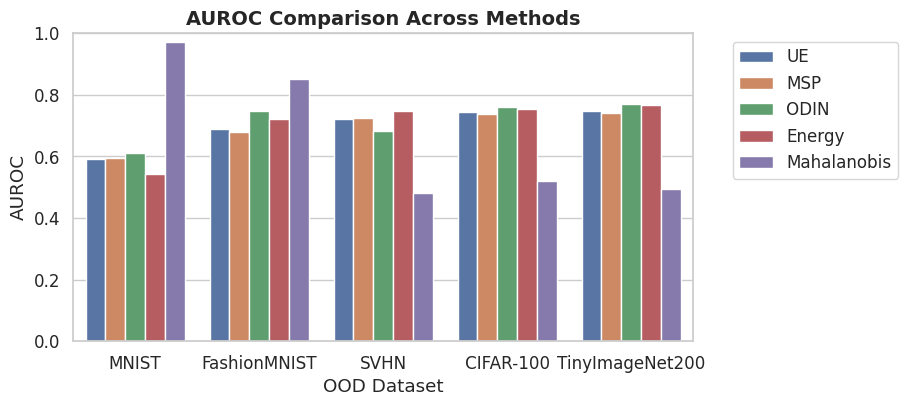

In [131]:
plot_metric_comparison(auroc_df, "AUROC")

In [132]:
print("=== AUPR Comparison ===")
display(aupr_df)

=== AUPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.5489,0.5506,0.5541,0.4857,0.9695
1,FashionMNIST,0.6574,0.6450,0.7023,0.6745,0.8458
2,SVHN,0.8071,0.8174,0.7715,0.8268,0.7000
3,CIFAR-100,0.7023,0.6915,0.7190,0.7142,0.5346
4,TinyImageNet200,0.7110,0.6995,0.7361,0.7328,0.5101


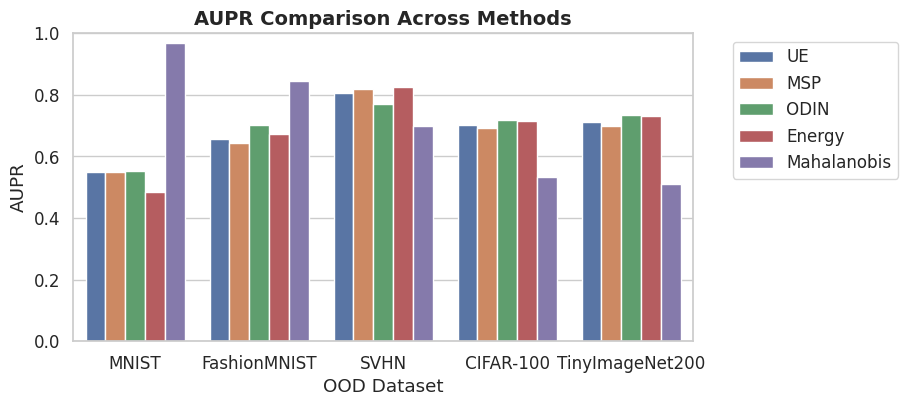

In [133]:
plot_metric_comparison(aupr_df, "AUPR")

In [134]:
print("=== FPR@95TPR Comparison ===")
display(fpr95_df)

=== FPR@95TPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.7795,0.7803,0.7518,0.7760,0.1216
1,FashionMNIST,0.8196,0.8197,0.7057,0.7275,0.5314
2,SVHN,0.6079,0.6086,0.6306,0.5758,0.9056
3,CIFAR-100,0.6632,0.6629,0.6619,0.6712,0.9445
4,TinyImageNet200,0.6774,0.6774,0.6663,0.6708,0.9476


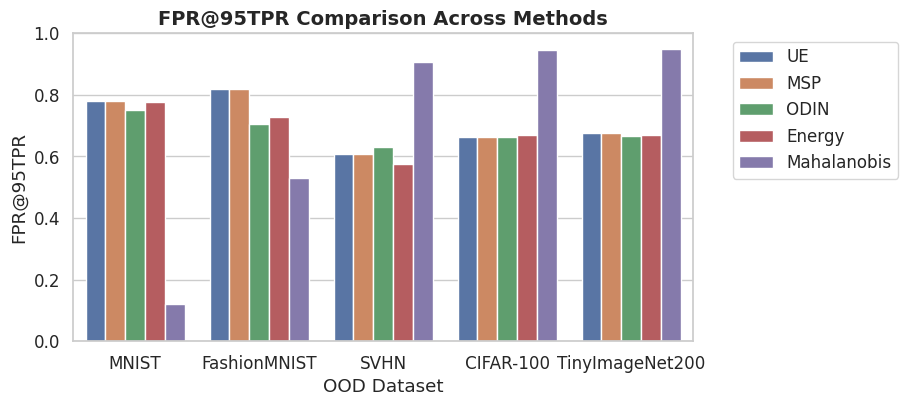

In [135]:
plot_metric_comparison(fpr95_df, "FPR@95TPR")

##### Including Garbage class

In [136]:
id_name = "SVHN"

In [137]:
# Compute class statistics from ID dataset
class_means, cov_inv = compute_mahalanobis_stats(model_after_inv, datasets[id_name], device)

In [138]:
exclude_garbage=False

###### UE

In [139]:
metric = "ue"

In [140]:
df_ue, results_ue = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - UE


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID ue Mean,OOD ue Mean,Separation
0,CIFAR10,0.2779,0.2232,1.0000,0.5695,0.3486,0.2209
1,MNIST,0.3411,0.2471,0.9950,0.5695,0.4271,0.1424
2,FashionMNIST,0.4981,0.3744,0.9980,0.5695,0.5383,0.0312
3,CIFAR-100,0.5625,0.4245,0.9713,0.5695,0.5964,0.0269
4,TinyImageNet200,0.5730,0.4411,0.9769,0.5695,0.6011,0.0316



Avg AUROC = 0.4505 | Avg AUPR = 0.3421 | Avg FPR@95TPR = 0.9882


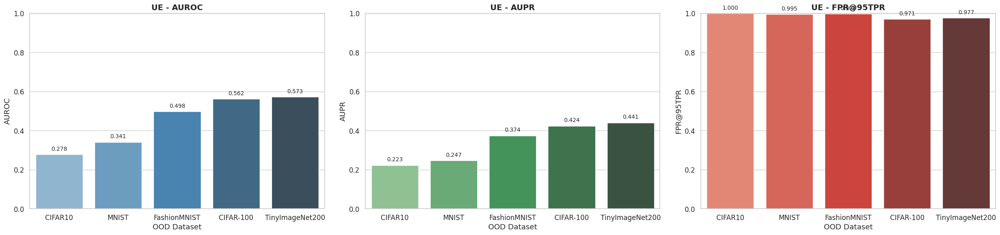

In [141]:
plot_ood_metrics(df_ue, metric)

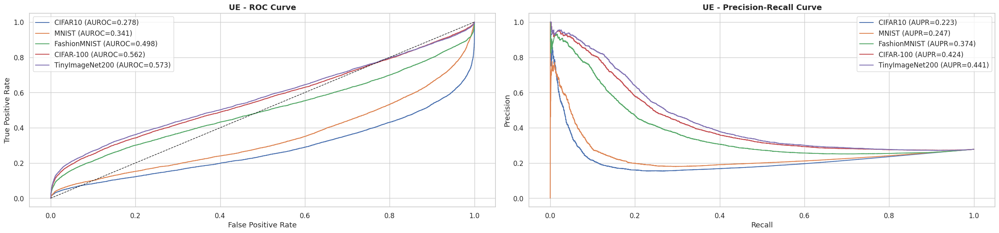

In [142]:
plot_ood_curves(results_ue, metric)

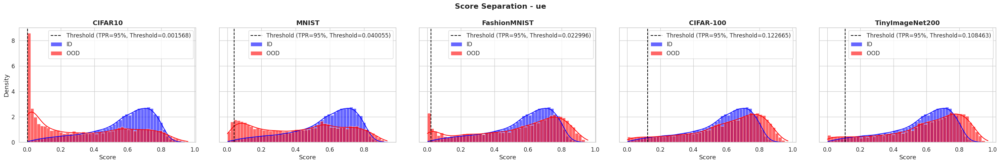

In [143]:
plot_separation_for_method(results_ue, method_name="ue", target_tpr=0.95)

###### MSP(Max-Softmax Probability)

In [144]:
metric = "msp"

In [145]:
df_msp, results_msp = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name= id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - MSP


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID msp Mean,OOD msp Mean,Separation
0,CIFAR10,0.2754,0.2100,1.0000,0.6085,0.7702,0.1617
1,MNIST,0.3401,0.2313,0.9950,0.6085,0.7173,0.1088
2,FashionMNIST,0.4709,0.3246,0.9980,0.6085,0.6340,0.0255
3,CIFAR-100,0.5408,0.3705,0.9715,0.6085,0.5860,0.0225
4,TinyImageNet200,0.5490,0.3842,0.9768,0.6085,0.5813,0.0272



Avg AUROC = 0.4352 | Avg AUPR = 0.3041 | Avg FPR@95TPR = 0.9883


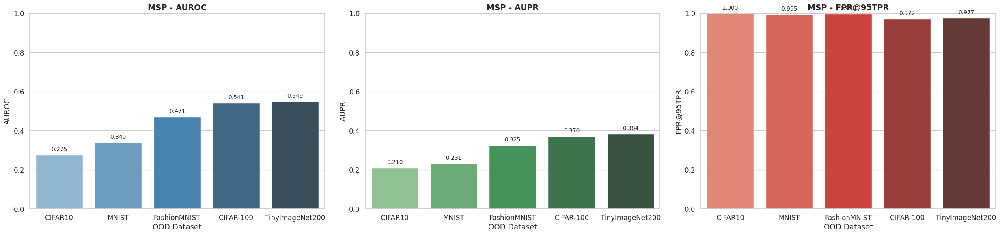

In [146]:
plot_ood_metrics(df_msp, metric)

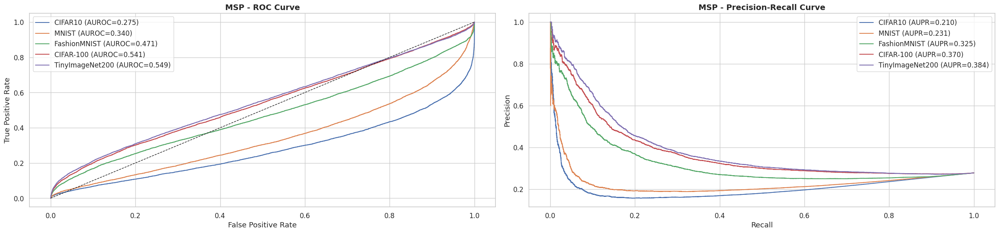

In [147]:
plot_ood_curves(results_msp, metric)

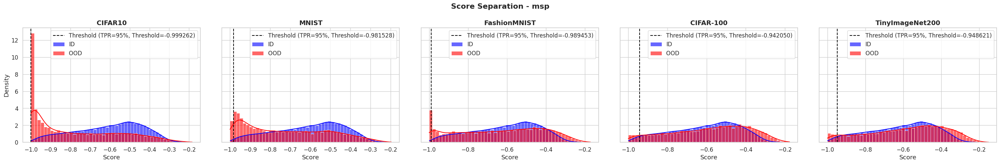

In [148]:
plot_separation_for_method(results_msp, method_name=metric, target_tpr=0.95)

###### ODIN(Out-of-distrbution detector for Neural Networks)

In [149]:
metric = "odin"

In [150]:
df_odin, results_odin = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - ODIN


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID odin Mean,OOD odin Mean,Separation
0,CIFAR10,0.3307,0.2628,0.9998,0.0915,0.0916,0.0002
1,MNIST,0.4322,0.3023,0.9853,0.0915,0.0915,0.0000
2,FashionMNIST,0.6152,0.4901,0.9814,0.0915,0.0914,0.0000
3,CIFAR-100,0.6651,0.5449,0.9508,0.0915,0.0914,0.0001
4,TinyImageNet200,0.6876,0.5801,0.9530,0.0915,0.0914,0.0001



Avg AUROC = 0.5462 | Avg AUPR = 0.4360 | Avg FPR@95TPR = 0.9741


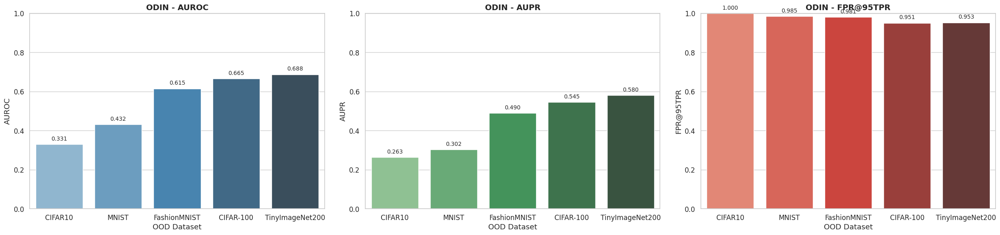

In [151]:
plot_ood_metrics(df_odin, metric)

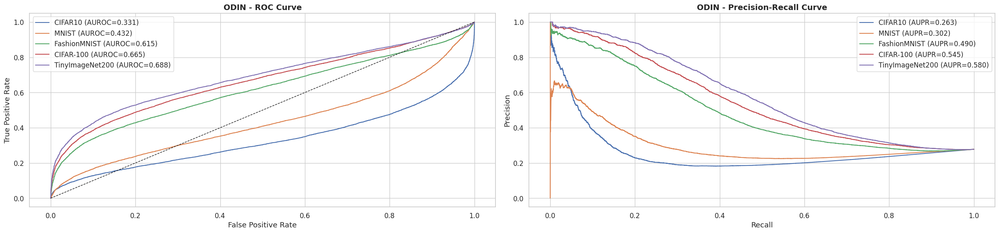

In [152]:
plot_ood_curves(results_odin, metric)

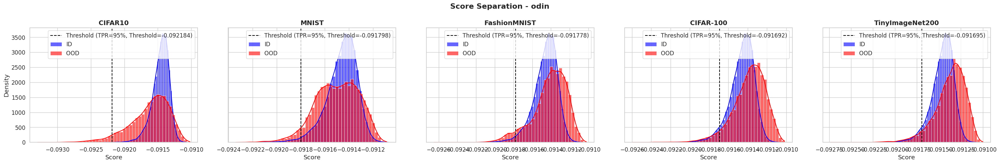

In [153]:
plot_separation_for_method(results_odin, method_name=metric, target_tpr=0.95)

###### Energy

In [154]:
metric = "energy"

In [155]:
df_energy, results_energy = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - ENERGY


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID energy Mean,OOD energy Mean,Separation
0,CIFAR10,0.2519,0.2069,0.9999,-3.4419,-5.1690,1.7271
1,MNIST,0.2242,0.1771,0.9951,-3.4419,-4.4863,1.0444
2,FashionMNIST,0.4945,0.3430,0.9899,-3.4419,-3.5909,0.1491
3,CIFAR-100,0.5437,0.3957,0.9816,-3.4419,-3.4378,0.0041
4,TinyImageNet200,0.5729,0.4279,0.9814,-3.4419,-3.3783,0.0635



Avg AUROC = 0.4174 | Avg AUPR = 0.3101 | Avg FPR@95TPR = 0.9896


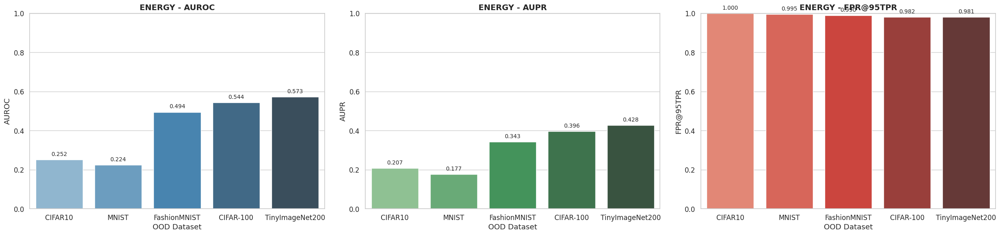

In [156]:
plot_ood_metrics(df_energy, metric)

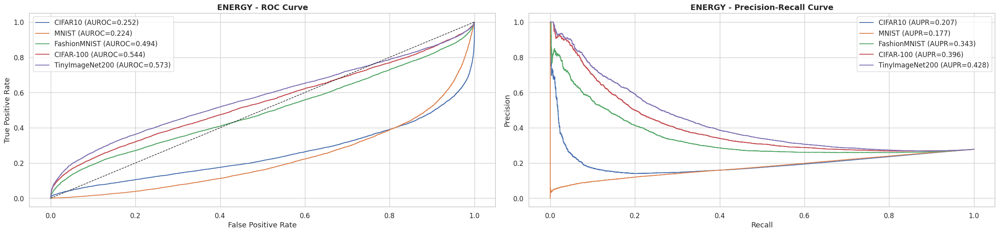

In [157]:
plot_ood_curves(results_energy, metric)

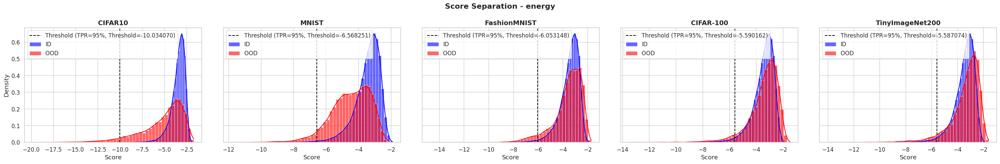

In [158]:
plot_separation_for_method(results_energy, method_name=metric, target_tpr=0.95)

###### Mahalanobis

In [159]:
metric = "mahalanobis"

In [160]:
df_maha, results_maha = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - MAHALANOBIS


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID mahalanobis Mean,OOD mahalanobis Mean,Separation
0,CIFAR10,0.9916,0.9804,0.0454,-121.8424,-21382.394531,21260.552734
1,MNIST,0.9923,0.9727,0.0272,-121.8424,-1929.060181,1807.217773
2,FashionMNIST,0.9903,0.9689,0.0361,-121.8424,-2860.003662,2738.161377
3,CIFAR-100,0.9872,0.9692,0.0638,-121.8424,-6864.820801,6742.978516
4,TinyImageNet200,0.9859,0.9667,0.0707,-121.8424,-6570.159180,6448.316895



Avg AUROC = 0.9895 | Avg AUPR = 0.9716 | Avg FPR@95TPR = 0.0486


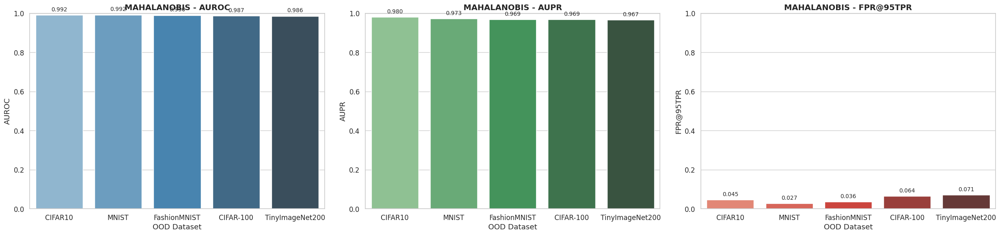

In [161]:
plot_ood_metrics(df_maha, metric)

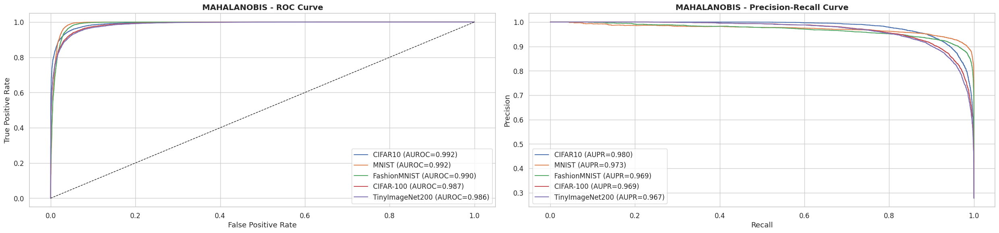

In [162]:
plot_ood_curves(results_maha, metric)

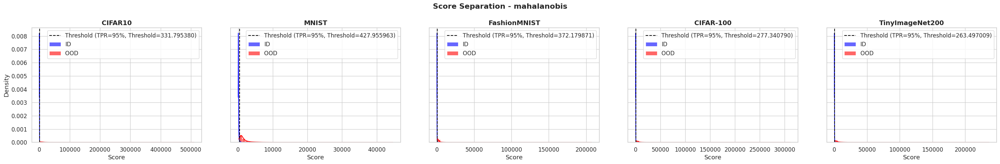

In [163]:
plot_separation_for_method(results_maha, method_name=metric, target_tpr=0.95)

###### Comparison

In [164]:
metric_dfs = {
    "UE": df_ue,
    "MSP": df_msp,
    "ODIN": df_odin,
    "Energy": df_energy,
    "Mahalanobis": df_maha
}

# Initialize empty dicts to store AUROC, AUPR, FPR separately
auroc_df, aupr_df, fpr95_df = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

for metric_name, df in metric_dfs.items():
    temp_df = df.set_index("OOD Dataset")
    auroc_df[metric_name] = temp_df["AUROC"]
    aupr_df[metric_name] = temp_df["AUPR"]
    fpr95_df[metric_name] = temp_df["FPR@95TPR"]

# Reset index so OOD Dataset is a column
auroc_df = auroc_df.reset_index()
aupr_df = aupr_df.reset_index()
fpr95_df = fpr95_df.reset_index()

In [165]:
print("=== AUROC Comparison ===")
display(auroc_df)

=== AUROC Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,CIFAR10,0.2779,0.2754,0.3307,0.2519,0.9916
1,MNIST,0.3411,0.3401,0.4322,0.2242,0.9923
2,FashionMNIST,0.4981,0.4709,0.6152,0.4945,0.9903
3,CIFAR-100,0.5625,0.5408,0.6651,0.5437,0.9872
4,TinyImageNet200,0.5730,0.5490,0.6876,0.5729,0.9859


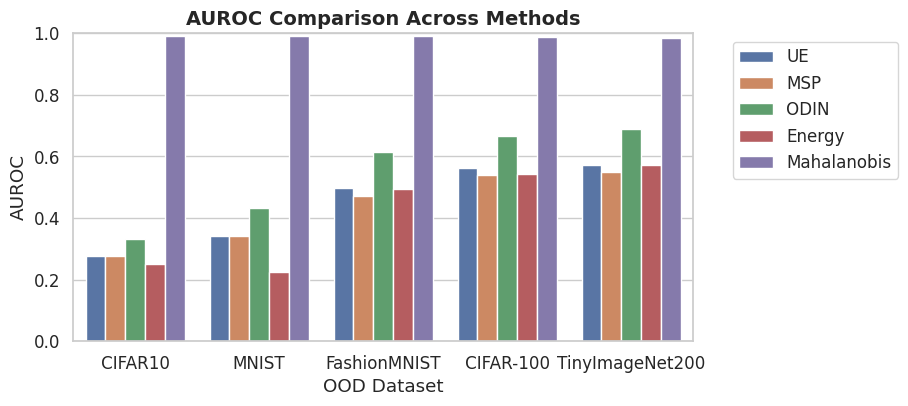

In [166]:
plot_metric_comparison(auroc_df, "AUROC")

In [167]:
print("=== AUPR Comparison ===")
display(aupr_df)

=== AUPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,CIFAR10,0.2232,0.2100,0.2628,0.2069,0.9804
1,MNIST,0.2471,0.2313,0.3023,0.1771,0.9727
2,FashionMNIST,0.3744,0.3246,0.4901,0.3430,0.9689
3,CIFAR-100,0.4245,0.3705,0.5449,0.3957,0.9692
4,TinyImageNet200,0.4411,0.3842,0.5801,0.4279,0.9667


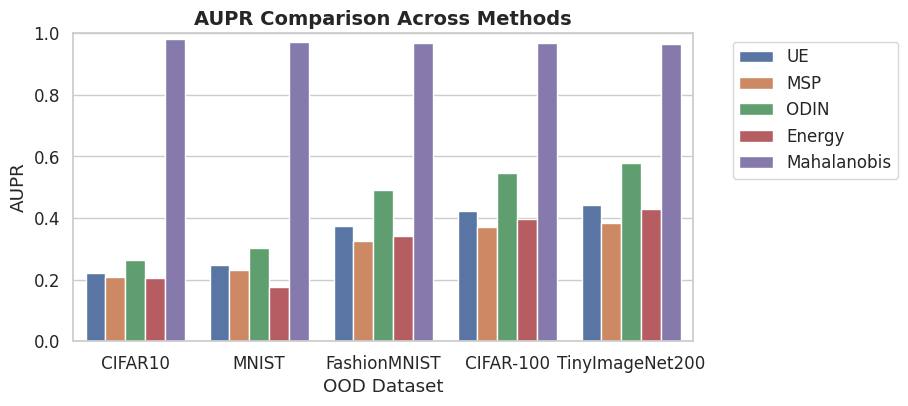

In [168]:
plot_metric_comparison(aupr_df, "AUPR")

In [169]:
print("=== FPR@95TPR Comparison ===")
display(fpr95_df)

=== FPR@95TPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,CIFAR10,1.0000,1.0000,0.9998,0.9999,0.0454
1,MNIST,0.9950,0.9950,0.9853,0.9951,0.0272
2,FashionMNIST,0.9980,0.9980,0.9814,0.9899,0.0361
3,CIFAR-100,0.9713,0.9715,0.9508,0.9816,0.0638
4,TinyImageNet200,0.9769,0.9768,0.9530,0.9814,0.0707


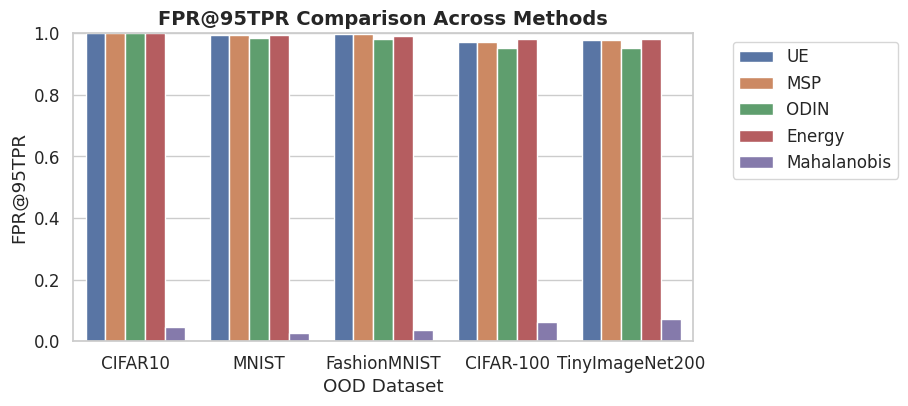

In [170]:
plot_metric_comparison(fpr95_df, "FPR@95TPR")